In [1]:
import rasterio
import numpy as np
import os

# 1. Definir la ruta base donde están tus archivos
path_base = "/content/drive/MyDrive/Proyecto3.0/Sentinel/"

# 2. Diccionario con el prefijo común de tus archivos
# Nota: Asegúrate de que el nombre coincida exactamente hasta antes del Bxx
prefix = "HLS.S30.T19JCJ.2026037T144901.v2.0"

def cargar_banda(num_banda):
    file_path = os.path.join(path_base, f"{prefix}_{num_banda}.tif")
    with rasterio.open(file_path) as src:
        # Cargamos como float32 para los cálculos de los ratios
        return src.read(1).astype('float32')

# 3. Cargar todas las capas solicitadas
print("Cargando bandas de Sentinel-2...")

b1  = cargar_banda("B01")
b2  = cargar_banda("B02")
b4  = cargar_banda("B04")
b6  = cargar_banda("B06")
b7  = cargar_banda("B07")
b8  = cargar_banda("B08")
b9  = cargar_banda("B09")
b11 = cargar_banda("B11")
b12 = cargar_banda("B12")

print("¡Todas las capas cargadas correctamente en memoria!")

Cargando bandas de Sentinel-2...
¡Todas las capas cargadas correctamente en memoria!


Calculando índices de alteración...


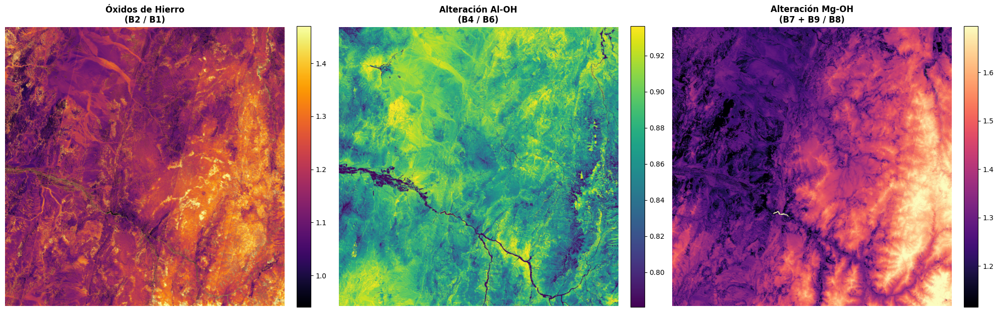

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Configurar el manejo de errores para divisiones (evita crash por valores 0)
np.seterr(divide='ignore', invalid='ignore')

# 2. Calcular los Índices solicitados
print("Calculando índices de alteración...")

# Óxidos de Hierro: B2 (Azul) / B1 (Aerosoles)
# Nota: En HLS S30, B02/B01 resalta la pendiente de absorción del hierro en el ultra-azul
oxidos_hierro = np.divide(b2, b1, out=np.zeros_like(b2), where=b1!=0)

# Alteración Al-OH: B4 (Rojo) / B6 (Red Edge)
al_oh = np.divide(b4, b6, out=np.zeros_like(b4), where=b6!=0)

# Alteración Mg-OH: (B7 + B9) / B8
mg_oh = np.divide((b7 + b9), b8, out=np.zeros_like(b7), where=b8!=0)

# 3. Visualización comparativa
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# Función auxiliar para aplicar contraste (percentiles 2 y 98)
def plot_indice(ax, data, titulo, cmap):
    # Limpiamos valores extremos/nulos para el contraste
    vmin, vmax = np.nanpercentile(data, [2, 98])
    im = ax.imshow(data, cmap=cmap, vmin=vmin, vmax=vmax)
    ax.set_title(titulo, fontsize=12, fontweight='bold')
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    ax.axis('off')

# Renderizar los 3 mapas
plot_indice(axes[0], oxidos_hierro, "Óxidos de Hierro\n(B2 / B1)", "inferno")
plot_indice(axes[1], al_oh, "Alteración Al-OH\n(B4 / B6)", "viridis")
plot_indice(axes[2], mg_oh, "Alteración Mg-OH\n(B7 + B9 / B8)", "magma")

plt.tight_layout()
plt.show()

Procesando capas para entrenamiento RF...


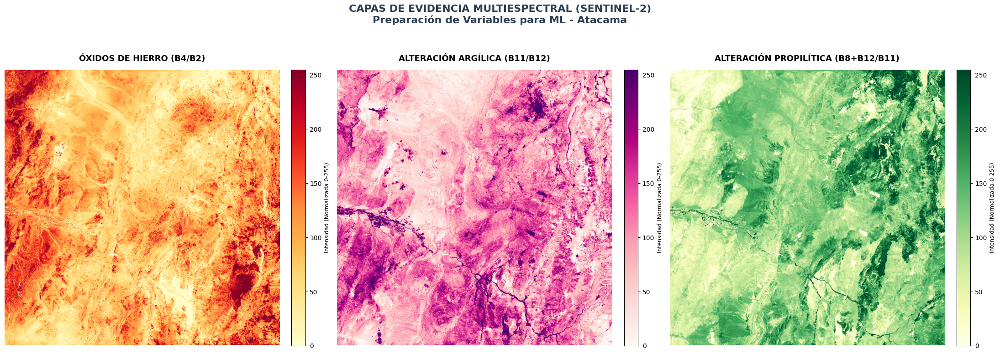

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Configuración de Cálculo
np.seterr(divide='ignore', invalid='ignore')

def normalizar_0_255(data):
    """Escala los datos al rango 0-255 usando percentiles para evitar ruidos."""
    p2, p98 = np.nanpercentile(data, [2, 98])
    temp = np.clip(data, p2, p98)
    return ((temp - p2) / (p98 - p2) * 255).astype(np.uint8)

# 2. Procesamiento de Ratios
print("Procesando capas para entrenamiento RF...")
hierro_norm = normalizar_0_255(np.divide(b4, b2, out=np.zeros_like(b4), where=b2!=0))
argilica_norm = normalizar_0_255(np.divide(b11, b12, out=np.zeros_like(b11), where=b12!=0))
propilitica_norm = normalizar_0_255(np.divide((b8 + b12), b11, out=np.zeros_like(b8), where=b11!=0))

# 3. Configuración de la Galería
indices = [hierro_norm, argilica_norm, propilitica_norm]
titulos = [
    "ÓXIDOS DE HIERRO (B4/B2)",
    "ALTERACIÓN ARGÍLICA (B11/B12)",
    "ALTERACIÓN PROPILÍTICA (B8+B12/B11)"
]

# Temas de colores específicos para cada geología:
# - Hierro: Naranjas/Rojos (Hematita)
# - Argílica: Púrpuras/Rojos (Arcillas)
# - Propilítica: Verdes (Clorita/Epidota)
colormaps = ['YlOrRd', 'RdPu', 'YlGn']

fig, axes = plt.subplots(1, 3, figsize=(22, 8), dpi=100)
plt.style.use('default')

for i, ax in enumerate(axes):
    im = ax.imshow(indices[i], cmap=colormaps[i])
    ax.set_title(titulos[i], fontsize=13, fontweight='bold', pad=15)

    # Barra de color con la escala 0-255
    cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label('Intensidad (Normalizada 0-255)', fontsize=9)

    ax.axis('off')

plt.suptitle('CAPAS DE EVIDENCIA MULTIESPECTRAL (SENTINEL-2)\nPreparación de Variables para ML - Atacama',
             fontsize=16, fontweight='bold', y=1.02, color='#2c3e50')

plt.tight_layout()
plt.savefig("Sentinel_Ratios_LinkedIn.png", dpi=300, bbox_inches='tight')
plt.show()

In [4]:
import rasterio
from rasterio.mask import mask
import geopandas as gpd
import os

# 1. Definir Rutas
output_dir = "/content/drive/MyDrive/Proyecto3.0/Sentinel/"
path_lito = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_LITO_P_32719.shp"
# Ruta de referencia (usamos la Banda 2)
ref_path = f"{path_base}{prefix}_B02.tif"

def recortar_con_alineacion(data_array, nombre_archivo):

    # A. Abrir la imagen de referencia para leer sus coordenadas
    with rasterio.open(ref_path) as src:
        raster_crs = src.crs
        raster_bounds = src.bounds
        original_transform = src.transform

        print(f" Sistema de la Imagen: {raster_crs}")

        # B. Cargar y Reproyectar el Shapefile al vuelo
        gdf = gpd.read_file(path_lito)

        # Si los sistemas son distintos, transformamos el vector al sistema de la imagen
        if gdf.crs != raster_crs:
            print(f"Reproyectando Shapefile de {gdf.crs} a {raster_crs}...")
            gdf = gdf.to_crs(raster_crs)
        else:
            print("Los sistemas de coordenadas ya coinciden.")

        # C. Filtrar geometrías inválidas
        gdf = gdf[~gdf.geometry.is_empty & gdf.geometry.notna()]

        # D. Verificar si hay superposición real
        # Obtenemos los límites del shapefile reproyectado
        minx, miny, maxx, maxy = gdf.total_bounds
        # Verificamos si la caja del shape toca la caja de la imagen
        overlap = not (maxx < raster_bounds.left or minx > raster_bounds.right or
                       maxy < raster_bounds.bottom or miny > raster_bounds.top)

        if not overlap:
            print(f"ERROR CRÍTICO: El Shapefile y la Imagen NO se tocan geográficamente.")
            print(f"   Imagen: {raster_bounds}")
            print(f"   Shape : ({minx}, {miny}, {maxx}, {maxy})")
            return # Detenemos la función aquí

        # E. Preparar geometrías para el recorte
        geoms = [g.__geo_interface__ for g in gdf.geometry.values]

        # F. Crear archivo en memoria y Recortar
        with rasterio.io.MemoryFile() as memfile:
            with memfile.open(
                driver='GTiff',
                height=data_array.shape[0],
                width=data_array.shape[1],
                count=1,
                dtype=rasterio.float32,
                crs=raster_crs,
                transform=original_transform
            ) as mem:
                mem.write(data_array.astype(rasterio.float32), 1)

                try:
                    out_image, out_transform = mask(mem, geoms, crop=True)

                    # Actualizar metadatos
                    out_meta = src.meta.copy()
                    out_meta.update({
                        "driver": "GTiff",
                        "height": out_image.shape[1],
                        "width": out_image.shape[2],
                        "transform": out_transform,
                        "nodata": 0,
                        "dtype": rasterio.float32
                    })

                    # Guardar archivo final
                    final_path = os.path.join(output_dir, f"{nombre_archivo}_Clipped.tif")
                    with rasterio.open(final_path, "w", **out_meta) as dest:
                        dest.write(out_image[0], 1)

                    print(f"Guardado Exitoso: {nombre_archivo}_Clipped.tif")

                except ValueError as e:
                    print(f"Error en recorte de {nombre_archivo}: {e}")

# 2. Ejecutar la función
print("--- Iniciando Proceso de Recorte Seguro ---")
recortar_con_alineacion(hierro_norm, "Ratio_Hierro")
recortar_con_alineacion(argilica_norm, "Ratio_Argilica")
recortar_con_alineacion(propilitica_norm, "Ratio_Propilitica")

--- Iniciando Proceso de Recorte Seguro ---
 Sistema de la Imagen: EPSG:32619
Reproyectando Shapefile de EPSG:32719 a EPSG:32619...
Guardado Exitoso: Ratio_Hierro_Clipped.tif
 Sistema de la Imagen: EPSG:32619
Reproyectando Shapefile de EPSG:32719 a EPSG:32619...
Guardado Exitoso: Ratio_Argilica_Clipped.tif
 Sistema de la Imagen: EPSG:32619
Reproyectando Shapefile de EPSG:32719 a EPSG:32619...
Guardado Exitoso: Ratio_Propilitica_Clipped.tif


In [5]:
import pandas as pd
import rasterio
import os
from pyproj import Transformer

# ==========================================
# 1. CONFIGURACIÓN DE RUTAS
# ==========================================
# Ruta Dataset Maestro
input_table_path = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final.parquet'

# Carpeta Sentinel recortados
sentinel_dir = "/content/drive/MyDrive/Proyecto3.0/Sentinel/"
archivos_sentinel = {
    "S2_Hierro": "Ratio_Hierro_Clipped.tif",
    "S2_Argilica": "Ratio_Argilica_Clipped.tif",
    "S2_Propilitica": "Ratio_Propilitica_Clipped.tif"
}

# ==========================================
# 2. CARGAR LA TABLA DE PUNTOS
# ==========================================
print(f"Cargando tabla maestra: {os.path.basename(input_table_path)}...")

df_maestro = pd.read_parquet(input_table_path)


print(f"   Filas cargadas: {len(df_maestro):,}")
print("   Columnas actuales:", list(df_maestro.columns))

# ==========================================
# 3. EXTRACCIÓN DE VALORES (SAMPLING)
# ==========================================
print("\nIniciando extracción de valores Sentinel...")

# Preparamos las coordenadas originales (Asumimos que están en EPSG:32719 - Atacama)
puntos_x = df_maestro['Este_UTM'].values
puntos_y = df_maestro['Norte_UTM'].values

for col_name, file_name in archivos_sentinel.items():
    ruta_tif = os.path.join(sentinel_dir, file_name)

    if os.path.exists(ruta_tif):
        with rasterio.open(ruta_tif) as src:
            print(f"   Muestreando: {file_name} -> Columna: {col_name}")

            # --- TRUCO DE COORDENADAS ---
            # Si la imagen tiene un CRS distinto (ej. 32619 vs 32719), transformamos los puntos
            # para que coincidan con la imagen.
            if src.crs.to_string() != "EPSG:32719":
                print(f"      Ajustando coordenadas de puntos a {src.crs}...")
                transformer = Transformer.from_crs("EPSG:32719", src.crs, always_xy=True)
                xs, ys = transformer.transform(puntos_x, puntos_y)
                coords = list(zip(xs, ys))
            else:
                coords = list(zip(puntos_x, puntos_y))

            # Extraer valor del pixel (sample)
            # generator -> list -> numpy array
            valores = [x[0] for x in src.sample(coords)]

            # Guardar en el DataFrame
            df_maestro[col_name] = valores

    else:
        print(f"   ERROR: No encuentro el archivo {ruta_tif}")

# ==========================================
# 4. LIMPIEZA Y GUARDADO
# ==========================================
# A veces quedan valores -9999 o infinitos fuera del recorte, los convertimos a NaN o 0
cols_nuevas = list(archivos_sentinel.keys())
print("\nLimpiando valores nulos/vacíos...")
for col in cols_nuevas:
    # Reemplazar valores de no-data (ej. 0 absoluto o muy negativos)
    df_maestro[col] = df_maestro[col].replace([0, -float('inf'), float('inf')], float('nan'))

    # Opcional: Rellenar con la media o 0 si prefieres no perder filas
    # Para Random Forest, a veces es mejor dejar NaN y usar imputación, o poner 0 si significa "sin alteración"
    df_maestro[col] = df_maestro[col].fillna(0)

# Guardar el nuevo Dataset Maestro enriquecido
output_path = input_table_path.replace(".parquet", "_v2_Sentinel.parquet")
df_maestro.to_parquet(output_path)
# También en CSV por seguridad
df_maestro.to_csv(output_path.replace(".parquet", ".csv"), index=False)

print(f"\n¡LISTO! Nuevo dataset guardado en:\n   {output_path}")
print("   Ahora Random Forest tendrá visión multiespectral.")

Cargando tabla maestra: Dataset_Maestro_Con_Mag_Final.parquet...
   Filas cargadas: 6,832,678
   Columnas actuales: ['Este_UTM', 'Norte_UTM', 'ASTER_Alteration', 'Anomaly_Score', 'Magnetometria']

Iniciando extracción de valores Sentinel...
   Muestreando: Ratio_Hierro_Clipped.tif -> Columna: S2_Hierro
      Ajustando coordenadas de puntos a EPSG:32619...
   Muestreando: Ratio_Argilica_Clipped.tif -> Columna: S2_Argilica
      Ajustando coordenadas de puntos a EPSG:32619...
   Muestreando: Ratio_Propilitica_Clipped.tif -> Columna: S2_Propilitica
      Ajustando coordenadas de puntos a EPSG:32619...

Limpiando valores nulos/vacíos...

¡LISTO! Nuevo dataset guardado en:
   /content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet
   Ahora Random Forest tendrá visión multiespectral.


In [7]:
import pandas as pd
import numpy as np

# 1. Cargar tabla recién creada
path_tabla = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet'
print(f"Cargando: {path_tabla}...")
df = pd.read_parquet(path_tabla)

# 2. Definir las columnas a escalar
columnas_sentinel = ['S2_Hierro', 'S2_Argilica', 'S2_Propilitica']

def escalar_a_byte(serie):
    """Convierte una columna de floats a 0-255 (uint8) usando percentiles"""
    # Calculamos percentiles 2% y 98% para ignorar valores extremos (outliers)
    p2, p98 = np.nanpercentile(serie, [2, 98])

    # Recortamos los valores que se salgan de ese rango (Clipping)
    serie_clip = np.clip(serie, p2, p98)

    # Fórmula de normalización Min-Max expandida a 255
    # (Valor - Min) / (Max - Min) * 255
    serie_norm = (serie_clip - p2) / (p98 - p2) * 255

    return serie_norm.astype(np.uint8) # Convertimos a entero ligero

# 3. Aplicar la transformación
print("\n Normalizando columnas a escala 0-255...")
for col in columnas_sentinel:
    print(f"   Procesando {col}...")
    # Hacemos una copia para comparar después si quieres
    df[col] = escalar_a_byte(df[col])

# 4. Verificación Rápida
print("\n Estadísticas Nuevas (Deben ser 0-255):")
print(df[columnas_sentinel + ['Magnetometria']].describe().round(1))

# 5. Guardar (Sobrescribimos o creamos v3)
output_path = path_tabla.replace("_v2_", "_v3_Scaled_")
df.to_parquet(output_path)
print(f"\n ¡LISTO! Tabla corregida guardada en: {output_path}")

Cargando: /content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet...

 Normalizando columnas a escala 0-255...
   Procesando S2_Hierro...
   Procesando S2_Argilica...
   Procesando S2_Propilitica...

 Estadísticas Nuevas (Deben ser 0-255):
       S2_Hierro  S2_Argilica  S2_Propilitica  Magnetometria
count  6832678.0    6832678.0       6832678.0      2575560.0
mean        79.8         86.6            85.4          103.2
std        104.8        113.3           111.8           43.8
min          0.0          0.0             0.0           33.0
25%          0.0          0.0             0.0           73.3
50%          0.0          0.0             0.0          100.3
75%        204.0        228.0           224.0          129.0
max        255.0        255.0           255.0          255.0

 ¡LISTO! Tabla corregida guardada en: /content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v3_Scaled_Sentinel.parquet


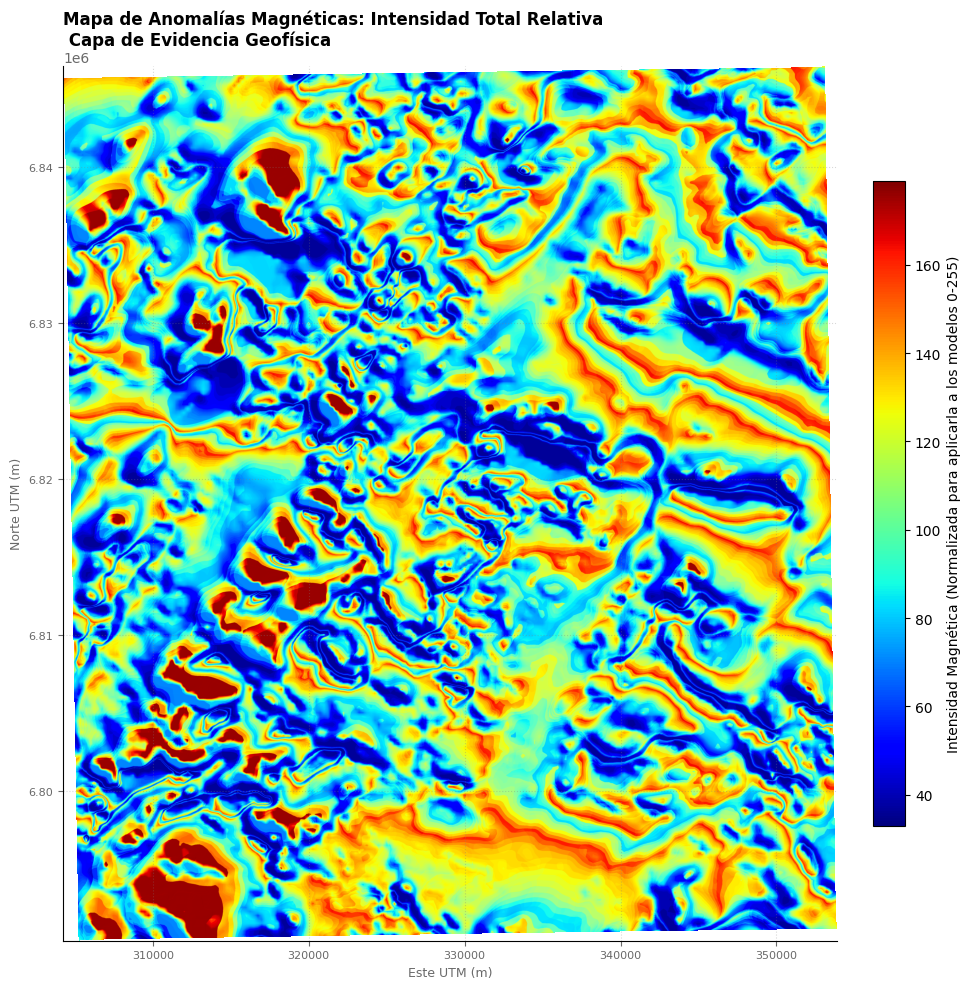

In [8]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LightSource

# 1. Cargar datos
# Asegúrate de usar la ruta correcta a tu archivo TIF
path_mag_tif = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_Reconstruida.tif"

with rasterio.open(path_mag_tif) as src:
    mag_data = src.read(1)
    mag_data = np.where(mag_data == src.nodata, np.nan, mag_data)
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

# 2. Configuración Académica Clásica
plt.style.use('default')
fig, ax = plt.subplots(figsize=(10, 10), dpi=100)

# Ajuste de contraste (Percentiles 2-98)
vmin, vmax = np.nanpercentile(mag_data, [2, 98])

# Sombreado sutil (Hillshade) para resaltar estructuras
ls = LightSource(azdeg=315, altdeg=45)

# TEMA DE COLOR: 'jet' es el clásico azul-verde-rojo de la geofísica tradicional.
# 'turbo' es una alternativa moderna que se ve igual pero es más legible.
# Usaremos 'jet' por tu solicitud de los colores clásicos.
tema_color = plt.cm.jet

shaded_mag = ls.shade(mag_data, cmap=tema_color, blend_mode='soft',
                      vmin=vmin, vmax=vmax, vert_exag=0.02)

# 3. Visualización
ax.imshow(shaded_mag, extent=extent)

# Barra de color con la escala corregida (sin nT)
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=plt.Normalize(vmin, vmax), cmap=tema_color),
                    ax=ax, fraction=0.036, pad=0.04)
cbar.set_label('Intensidad Magnética (Normalizada para aplicarla a los modelos 0-255)', fontsize=10)

# Títulos y Etiquetas
ax.set_title('Mapa de Anomalías Magnéticas: Intensidad Total Relativa\n Capa de Evidencia Geofísica',
             fontsize=12, pad=15, loc='left', fontweight='bold')

ax.set_xlabel('Este UTM (m)', fontsize=9, color='DimGray')
ax.set_ylabel('Norte UTM (m)', fontsize=9, color='DimGray')

# Estética de ejes
ax.tick_params(axis='both', which='major', labelsize=8, colors='DimGray')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.grid(True, linestyle=':', alpha=0.3, color='gray')

plt.tight_layout()
# Guardar con nombre descriptivo
plt.savefig("Magnetometria_Clasica_Atacama.png", dpi=300, bbox_inches='tight')
plt.show()

Calculando Primera Derivada Vertical (1VD)...
Archivo guardado en: /content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_1VD.tif


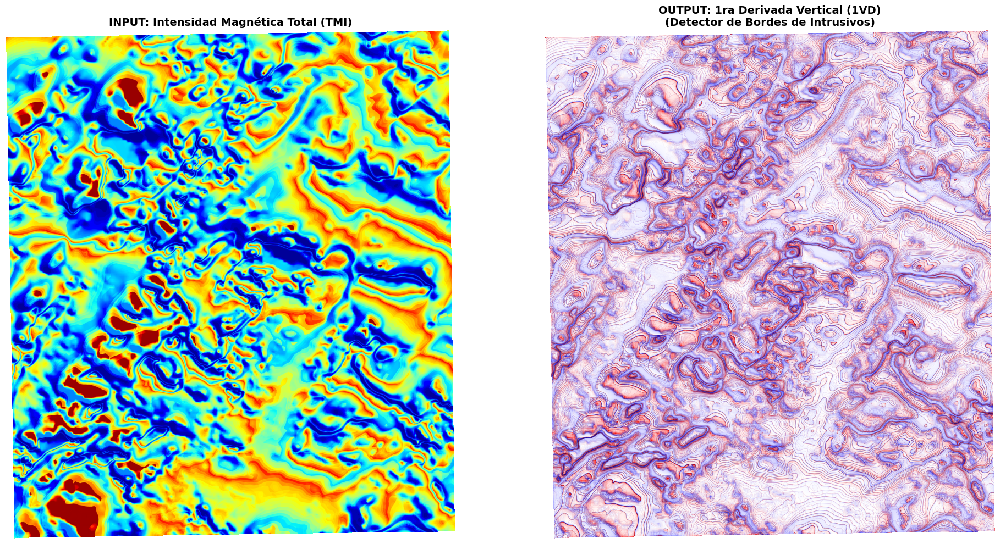

In [1]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LightSource

# -----------------------------------------------------------------------------
# FUNCION GEOFISICA: Primera Derivada Vertical (1VD) usando FFT
# -----------------------------------------------------------------------------
def calcular_derivada_vertical(data, transform):
    """
    Calcula la 1ra Derivada Vertical (1VD) de un campo potencial usando FFT.
    Requiere que la data no tenga NaNs (se rellenan temporalmente).
    """
    # 1. Preprocesamiento: Llenar NaNs con la media (FFT no soporta NaNs)
    data_filled = np.nan_to_num(data, nan=np.nanmean(data))

    # 2. Obtener dimensiones y tamaño de celda
    ny, nx = data_filled.shape
    dx = transform[0]  # Tamaño de pixel X
    dy = -transform[4] # Tamaño de pixel Y (usualmente negativo en TIF)

    # 3. Crear grilla de números de onda (Wavenumber domain)
    kx = np.fft.fftfreq(nx, dx) * 2 * np.pi
    ky = np.fft.fftfreq(ny, dy) * 2 * np.pi
    KX, KY = np.meshgrid(kx, ky)

    # Calcular número de onda radial |k|
    # La derivada vertical en frecuencia es simplemente multiplicar por |k|
    K = np.sqrt(KX**2 + KY**2)

    # 4. Aplicar FFT (Transformada de Fourier)
    fft_grid = np.fft.fft2(data_filled)

    # 5. Aplicar filtro de Derivada Vertical (Multiplicar por K)
    # Nota: A veces se usa K^n para derivada n-esima. Para 1ra es K^1.
    fft_derivada = fft_grid * K

    # 6. Transformada Inversa (volver al espacio)
    derivada_vertical = np.real(np.fft.ifft2(fft_derivada))

    # 7. Restaurar NaNs originales (para mantener la forma del mapa)
    derivada_vertical[np.isnan(data)] = np.nan

    return derivada_vertical

# -----------------------------------------------------------------------------
# CODIGO PRINCIPAL
# -----------------------------------------------------------------------------

# 1. Cargar datos
path_mag_tif = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_Reconstruida.tif"
path_salida_1vd = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_1VD.tif"

with rasterio.open(path_mag_tif) as src:
    mag_data = src.read(1)
    # Manejo de NoData
    nodata_val = src.nodata if src.nodata is not None else -9999
    mag_data = np.where(mag_data == nodata_val, np.nan, mag_data)

    # Guardamos metadata para exportar después
    meta = src.meta.copy()
    transform = src.transform
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

print("Calculando Primera Derivada Vertical (1VD)...")

# 2. CALCULAR 1VD
mag_1vd = calcular_derivada_vertical(mag_data, transform)

# 3. GUARDAR EL RESULTADO (Para modelo de Machine Learning)
meta.update({"driver": "GTiff", "dtype": "float32", "count": 1})
with rasterio.open(path_salida_1vd, "w", **meta) as dest:
    dest.write(mag_1vd.astype('float32'), 1)

print(f"Archivo guardado en: {path_salida_1vd}")

# -----------------------------------------------------------------------------
# 4. VISUALIZACIÓN COMPARATIVA (TMI vs 1VD)
# -----------------------------------------------------------------------------
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), dpi=100)

# Configuración de Sombreado
ls = LightSource(azdeg=315, altdeg=45)
tema_color = plt.cm.jet

# --- PLOT 1: MAGNETOMETRIA ORIGINAL (TMI) ---
vmin1, vmax1 = np.nanpercentile(mag_data, [2, 98])
shaded_mag = ls.shade(mag_data, cmap=tema_color, blend_mode='soft', vmin=vmin1, vmax=vmax1, vert_exag=0.02)
ax1.imshow(shaded_mag, extent=extent)
ax1.set_title('INPUT: Intensidad Magnética Total (TMI)', fontsize=14, fontweight='bold')
ax1.axis('off')

# --- PLOT 2: PRIMERA DERIVADA VERTICAL (1VD) ---
# La derivada suele tener valores centrados en 0, usamos percentiles robustos
vmin2, vmax2 = np.nanpercentile(mag_1vd, [2, 98])
# Usamos un mapa de color divergente (ej. 'seismic' o 'bwr') porque 1VD muestra bordes positivos/negativos
shaded_1vd = ls.shade(mag_1vd, cmap=plt.cm.seismic, blend_mode='soft', vmin=vmin2, vmax=vmax2, vert_exag=0.1)
ax2.imshow(shaded_1vd, extent=extent)
ax2.set_title('OUTPUT: 1ra Derivada Vertical (1VD)\n(Detector de Bordes de Intrusivos)', fontsize=14, fontweight='bold')
ax2.axis('off')

plt.tight_layout()
plt.savefig("Comparacion_TMI_vs_1VD.png", dpi=150)
plt.show()

Calculando Desviación Estándar con ventana de 51x51 píxeles...
Archivo guardado: /content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_1VD_StdDev.tif


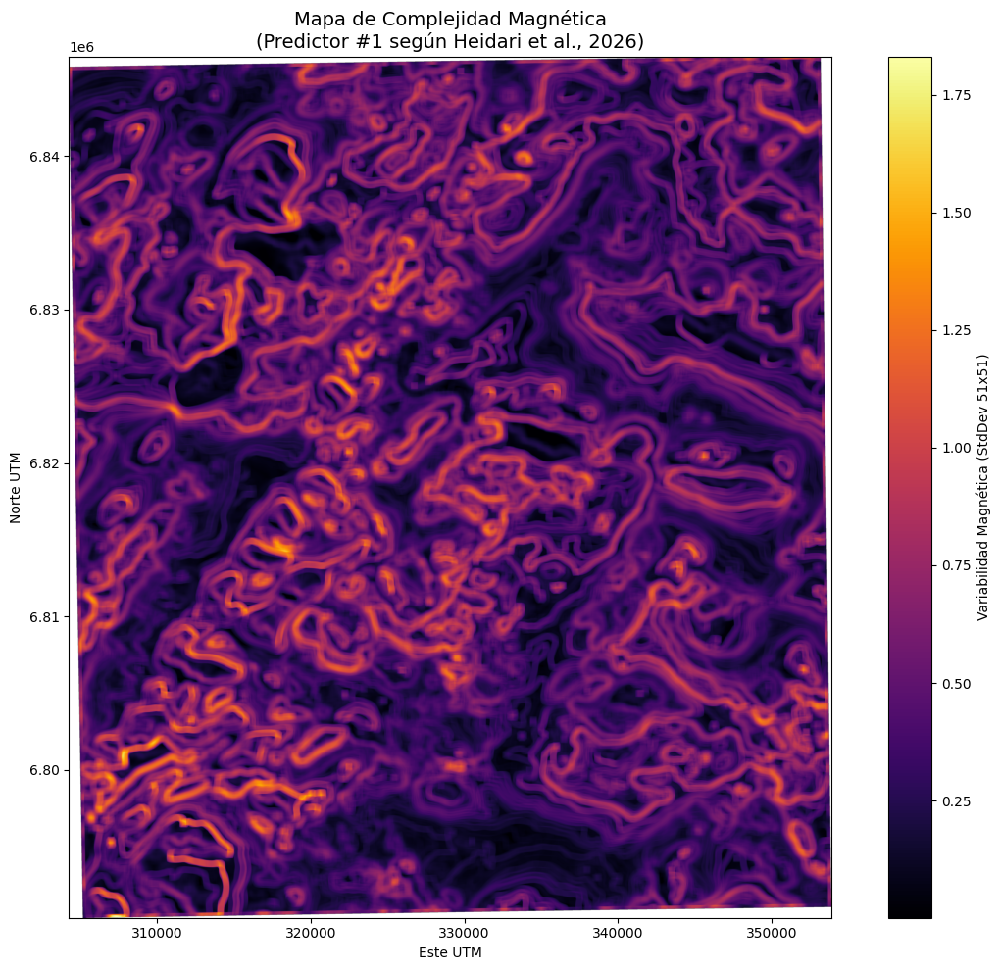

In [2]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter
from matplotlib.colors import LightSource

# -----------------------------------------------------------------------------
# CONFIGURACIÓN
# -----------------------------------------------------------------------------
input_path = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_1VD.tif"
output_path = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_1VD_StdDev.tif"

# TAMAÑO DE LA VENTANA (KERNEL)
# Esto define el "área de análisis".
# Si tu pixel es de 100m, una ventana de 11 son 1.1 km (tamaño de un depósito).
window_size = 51  # Debe ser impar (3, 5, 7, 11, etc.)

# -----------------------------------------------------------------------------
# PROCESAMIENTO
# -----------------------------------------------------------------------------
with rasterio.open(input_path) as src:
    # Leer la data de la 1VD
    data = src.read(1)
    meta = src.meta.copy()
    extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]

    # Manejar NaNs (rellenar temporalmente para el cálculo)
    data_filled = np.nan_to_num(data, nan=np.nanmean(data))

print(f"Calculando Desviación Estándar con ventana de {window_size}x{window_size} píxeles...")

# --- TRUCO MATEMÁTICO PARA HACERLO RÁPIDO ---
# StdDev = sqrt( E[x^2] - (E[x])^2 )
# Usamos filtro uniforme (promedio) que es muy rápido en scipy
c1 = uniform_filter(data_filled, size=window_size, mode='reflect')      # Media de x
c2 = uniform_filter(data_filled**2, size=window_size, mode='reflect')   # Media de x^2
std_dev = np.sqrt(c2 - c1**2)

# Restaurar NaNs originales (zonas fuera del mapa)
std_dev[np.isnan(data)] = np.nan

# -----------------------------------------------------------------------------
# GUARDAR RESULTADO
# -----------------------------------------------------------------------------
meta.update(dtype=rasterio.float32)
with rasterio.open(output_path, 'w', **meta) as dst:
    dst.write(std_dev.astype(rasterio.float32), 1)

print(f"Archivo guardado: {output_path}")

# -----------------------------------------------------------------------------
# VISUALIZACIÓN
# -----------------------------------------------------------------------------
plt.figure(figsize=(12, 10), dpi=100)

# Usamos 'magma' o 'inferno' porque los valores altos (brillantes) son los interesantes
plt.imshow(std_dev, cmap='inferno', extent=extent)
plt.colorbar(label=f'Variabilidad Magnética (StdDev {window_size}x{window_size})')

plt.title(f'Mapa de Complejidad Magnética\n(Predictor #1 según Heidari et al., 2026)', fontsize=14)
plt.xlabel('Este UTM')
plt.ylabel('Norte UTM')

plt.tight_layout()
plt.savefig("Magnetometria_StdDev_Map.png", dpi=150)
plt.show()

In [3]:
import rasterio
import numpy as np

path_mag_tif = "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_Reconstruida.tif"

with rasterio.open(path_mag_tif) as src:
    data = src.read(1)
    # Filtramos el NoData para no falsear la estadística
    valid_data = data[data != src.nodata]

    print(f"Valor Mínimo: {np.min(valid_data):.2f} nT")
    print(f"Valor Máximo: {np.max(valid_data):.2f} nT")
    print(f"Promedio: {np.mean(valid_data):.2f} nT")

Valor Mínimo: 33.00 nT
Valor Máximo: 215.00 nT
Promedio: 99.79 nT


 Se encontraron 6 archivos shapefile en la carpeta.
--------------------------------------------------
 GB_PLIEGUE_L_32719.shp
 GB_INT_ASS_EST_L_32719.shp
 GB_FALLA_L_32719.shp
 YACIMIENTOS_32719.shp
 CONTACTOS_32719.shp
 GB_LITO_P_32719.shp
--------------------------------------------------


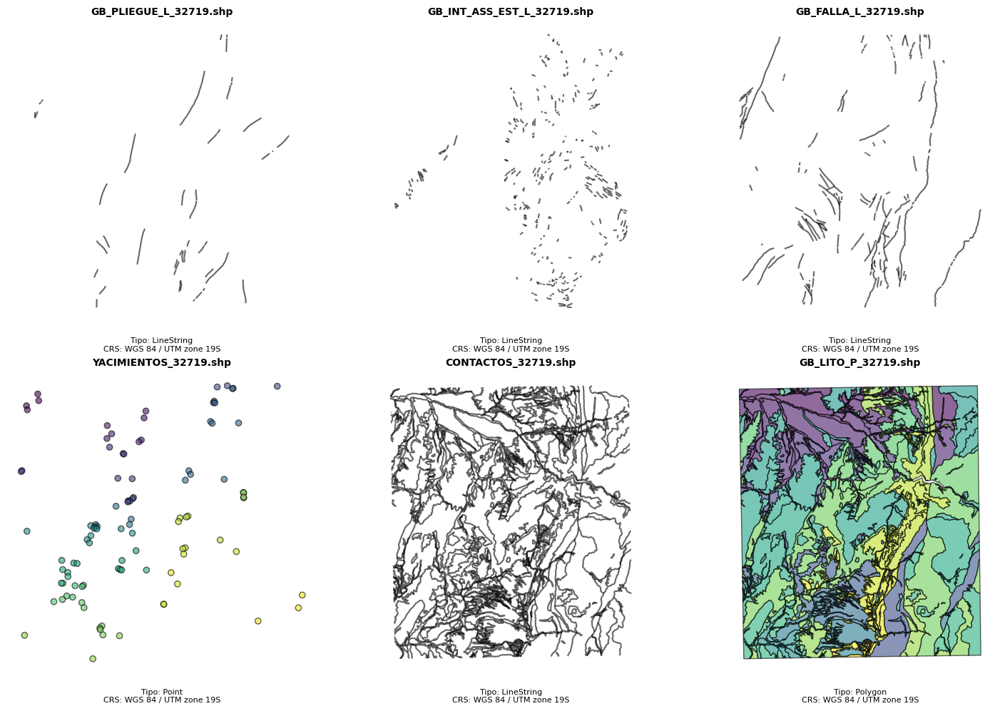

In [4]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt
import math

# 1. Configuración de la ruta
path_shapes = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/"

# 2. Listar todos los archivos .shp en la carpeta
# Hacemos una lista solo con los que terminan en .shp
archivos_shp = [f for f in os.listdir(path_shapes) if f.endswith('.shp')]
cantidad = len(archivos_shp)

print(f" Se encontraron {cantidad} archivos shapefile en la carpeta.")
print("-" * 50)
for f in archivos_shp:
    print(f" {f}")
print("-" * 50)

if cantidad > 0:
    # 3. Configurar la visualización dinámica (Grid de subplots)
    # Calculamos cuántas filas y columnas necesitamos para mostrar todo
    cols = 3  # Puedes cambiar esto a 2 o 4 según prefieras
    rows = math.ceil(cantidad / cols)

    # Tamaño de la figura (ancho, alto)
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten() # Aplanamos el array de ejes para iterar fácil

    # 4. Bucle para leer y plotear cada shape
    for i, archivo in enumerate(archivos_shp):
        ruta_completa = os.path.join(path_shapes, archivo)

        try:
            # Leer el shapefile
            gdf = gpd.read_file(ruta_completa)

            # Plotear en su eje correspondiente
            gdf.plot(ax=axes[i], cmap='viridis', edgecolor='black', alpha=0.6)

            # Títulos y estética
            axes[i].set_title(archivo, fontsize=10, fontweight='bold')
            axes[i].set_axis_off() # Quitar ejes lat/lon para limpieza visual

            # Opcional: Poner el tipo de geometría (Punto, Línea, Polígono)
            geom_type = gdf.geom_type.unique()[0]
            axes[i].text(0.5, -0.1, f"Tipo: {geom_type}\nCRS: {gdf.crs.name}",
                         transform=axes[i].transAxes, ha='center', fontsize=8)

        except Exception as e:
            print(f" Error al leer {archivo}: {e}")
            axes[i].text(0.5, 0.5, f"Error al leer\n{archivo}",
                         ha='center', va='center', transform=axes[i].transAxes, color='red')

    # 5. Limpiar ejes vacíos (si sobran espacios en el grid)
    for j in range(i + 1, len(axes)):
        axes[j].set_axis_off()

    plt.tight_layout()
    plt.show()

else:
    print(" No hay archivos .shp en la ruta especificada. Verifica la ruta o que Google Drive esté montado.")

In [5]:
import os
import geopandas as gpd
import pandas as pd

# Configuración para ver todas las columnas sin que se corten
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 10)
pd.set_option('display.width', 1000)

path_shapes = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/"

# Lista de archivos
archivos_interes = [
    "GB_PLIEGUE_L_32719.shp",
    "GB_INT_ASS_EST_L_32719.shp",
    "GB_FALLA_L_32719.shp",
    "YACIMIENTOS_32719.shp",
    "CONTACTOS_32719.shp",
    "GB_LITO_P_32719.shp"
]

print("INICIANDO AUDITORÍA DE SHAPEFILES...\n")

for archivo in archivos_interes:
    ruta = os.path.join(path_shapes, archivo)
    print("="*60)
    print(f"ANALIZANDO: {archivo}")

    try:
        gdf = gpd.read_file(ruta)

        # 1. Dimensiones básicas
        filas, cols = gdf.shape
        print(f"   Insumos (Geometrías): {filas}")
        print(f"   Columnas (Atributos): {cols}")
        print(f"   Tipo de Geometría: {gdf.geom_type.unique()[0]}")

        # 2. Ver las columnas disponibles
        print(f"\n   Columnas encontradas: {list(gdf.columns)}")

        # 3. Muestra de datos (Primeras 3 filas)
        print("\n   Muestra de datos:")
        print(gdf.drop(columns='geometry').head(3))

        # 4. Análisis específico según el archivo (Inteligencia Automática)
        print("\n   Análisis Rápido:")

        if "YACIMIENTOS" in archivo:
            # Buscar columnas clave de mineral
            posibles_col_mena = [c for c in gdf.columns if "MENA" in c or "ELEM" in c or "MIN" in c]
            if posibles_col_mena:
                print(f"      -> Columnas de Mineral posibles: {posibles_col_mena}")
                for c in posibles_col_mena:
                    print(f"      -> Valores únicos en '{c}': {gdf[c].unique()[:10]}...") # Muestra solo los primeros 10

        elif "FALLA" in archivo:
            # Buscar tipo de falla
            posibles_col_tipo = [c for c in gdf.columns if "TIPO" in c or "CLASE" in c or "NOMBRE" in c]
            if posibles_col_tipo:
                 for c in posibles_col_tipo:
                    print(f"      -> Tipos de falla en '{c}': {gdf[c].value_counts().head(5).to_dict()}")

        elif "LITO" in archivo:
            # Buscar unidad geológica
            posibles_col_unidad = [c for c in gdf.columns if "UNIDAD" in c or "COD" in c or "NM" in c]
            if posibles_col_unidad:
                 for c in posibles_col_unidad:
                    print(f"      -> Unidades principales en '{c}': {gdf[c].value_counts().head(5).to_dict()}")

    except Exception as e:
        print(f"   Error al leer: {e}")

    print("\n")

INICIANDO AUDITORÍA DE SHAPEFILES...

ANALIZANDO: GB_PLIEGUE_L_32719.shp
   Insumos (Geometrías): 47
   Columnas (Atributos): 10
   Tipo de Geometría: LineString

   Columnas encontradas: ['CD_CORRELA', 'ESCALA', 'SUBTIPO_DE', 'OBSERVACIO', 'NOMBRE', 'd_SUBTIPO', 'd_PROYECCI', 'd_TP_INFOR', 'd_TIPO_PLI', 'geometry']

   Muestra de datos:
  CD_CORRELA  ESCALA          SUBTIPO_DE OBSERVACIO NOMBRE           d_SUBTIPO      d_PROYECCI d_TP_INFOR                          d_TIPO_PLI
0       M164  100000  Pliegue anticlinal       None   None  Pliegue anticlinal  SIRGAS UTM 19S  Observada  Traza de plano axial de anticlinal
1       M164  100000  Pliegue anticlinal       None   None  Pliegue anticlinal  SIRGAS UTM 19S  Observada  Traza de plano axial de anticlinal
2       M164  100000  Pliegue anticlinal       None   None  Pliegue anticlinal  SIRGAS UTM 19S  Observada  Traza de plano axial de anticlinal

   Análisis Rápido:


ANALIZANDO: GB_INT_ASS_EST_L_32719.shp
   Insumos (Geometrías): 328
 

In [6]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt

path_shapes = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/"
archivo = "YACIMIENTOS_32719.shp"

try:
    gdf = gpd.read_file(os.path.join(path_shapes, archivo))

    # 1. Análisis de Elementos
    # Convertimos a string y mayúsculas para evitar errores
    gdf['d_ASS_MENA'] = gdf['d_ASS_MENA'].astype(str).fillna('')

    # Filtro: Contiene Cu, Au, Mo o Ag
    filtro_metalico = gdf['d_ASS_MENA'].str.contains('Cu|Au|Mo|Ag', case=False, regex=True)

    yac_target = gdf[filtro_metalico]
    yac_descarte = gdf[~filtro_metalico] # Los que NO tienen esos elementos

    print(f" REPORTE DE YACIMIENTOS:")
    print(f"   -> Total original: {len(gdf)}")
    print(f"   -> Yacimientos de interés (Cu, Au, Mo, Ag): {len(yac_target)} ")
    print(f"   -> Yacimientos descartados (Solo Fe, Co, Mn, u otros): {len(yac_descarte)} ")

    if len(yac_descarte) > 0:
        print(f"\n    Ejemplos de lo que estamos descartando (Primeros 5):")
        print(yac_descarte[['NOMBRE', 'd_ASS_MENA']].head(5))

    # 2. Análisis de Tipo para el Buffer
    # Vemos si son Vetas (estructuras finas) o Cuerpos/Diseminados (estructuras grandes)
    print(f"\n ANÁLISIS PARA BUFFER (Basado en 'd_FORMA' o 'd_TIPO_YAC'):")
    print(yac_target['d_FORMA'].value_counts())

except Exception as e:
    print(f"Error: {e}")

 REPORTE DE YACIMIENTOS:
   -> Total original: 103
   -> Yacimientos de interés (Cu, Au, Mo, Ag): 87 
   -> Yacimientos descartados (Solo Fe, Co, Mn, u otros): 16 

    Ejemplos de lo que estamos descartando (Primeros 5):
              NOMBRE d_ASS_MENA
1        Dos Amigos?         Fe
4      Chillan Viejo         Fe
5            Viviana         Fe
7   La Culebra Norte         Fe
12       La Mariposa         Fe

 ANÁLISIS PARA BUFFER (Basado en 'd_FORMA' o 'd_TIPO_YAC'):
d_FORMA
Veta                    64
Manto                   11
Stockwork                4
Estratoligado            4
Irregular                2
Relleno de fracturas     1
Name: count, dtype: int64


In [7]:
import os
import geopandas as gpd

# CONFIGURACIÓN DE RUTAS
path_origen = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/"
path_destino = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_limpios/"

if not os.path.exists(path_destino):
    os.makedirs(path_destino)

print("PROCESANDO CAPA 1: YACIMIENTOS (FILTRO Y BUFFER VARIABLE)...\n")

try:
    # 1. CARGAR ARCHIVO
    yac = gpd.read_file(os.path.join(path_origen, "YACIMIENTOS_32719.shp"))

    # 2. FILTRAR POR MENA (Cu, Au, Mo, Ag)
    # Convertimos a string para evitar errores con valores nulos
    yac['d_ASS_MENA'] = yac['d_ASS_MENA'].astype(str).fillna('')
    # Usamos expresiones regulares para buscar cualquiera de los elementos
    filtro_metalico = yac['d_ASS_MENA'].str.contains('Cu|Au|Mo|Ag', case=False, regex=True)
    yac_target = yac[filtro_metalico].copy()

    print(f"REPORTE DE FILTRADO:")
    print(f"   -> Total Original: {len(yac)}")
    print(f"   -> Yacimientos Target (Cu-Au-Mo-Ag): {len(yac_target)} ")
    print(f"   -> Descartados (Fe puro, etc.): {len(yac) - len(yac_target)} ")

    # 3. DEFINIR FUNCIÓN DE BUFFER VARIABLE
    def get_buffer_radius(row):
        # Normalizamos a minúsculas para comparar fácil
        forma = str(row['d_FORMA']).lower() if row['d_FORMA'] else ''
        tipo = str(row['d_TIPO_YAC']).lower() if row['d_TIPO_YAC'] else ''

        # Lógica Jerárquica
        if 'stockwork' in forma or 'stockwork' in tipo:
            return 500  # Sistema grande
        elif 'manto' in forma or 'estratoligado' in forma:
            return 300  # Continuidad lateral
        elif 'veta' in forma or 'veta' in tipo:
            return 300  # Conservador
        elif 'irregular' in forma or 'relleno' in forma:
            return 100  # Puntual
        else:
            return 200  # Default de seguridad

    # Aplicar la función fila por fila
    yac_target['BUFFER_RAD'] = yac_target.apply(get_buffer_radius, axis=1)

    # 4. CREAR GEOMETRÍA DE BUFFER
    # GeoPandas usa la unidad del CRS (metros en UTM 19S)
    yac_buffer = yac_target.copy()
    yac_buffer['geometry'] = yac_target.geometry.buffer(yac_buffer['BUFFER_RAD'])

    # 5. GUARDAR RESULTADOS
    # Guardamos los PUNTOS filtrados (útil para referencia)
    out_puntos = os.path.join(path_destino, "YACIMIENTOS_TARGET_PUNTOS.shp")
    yac_target.to_file(out_puntos)

    # Guardamos los POLÍGONOS de buffer (ESTO ES LO QUE ENTRA AL MODELO)
    out_buffer = os.path.join(path_destino, "YACIMIENTOS_TARGET_BUFFER.shp")
    yac_buffer.to_file(out_buffer)

    print("\nPROCESO TERMINADO EXITOSAMENTE")
    print(f"   Archivo de Puntos: {out_puntos}")
    print(f"   Archivo de Buffers: {out_buffer}")

    # Mostrar resumen de qué radios se usaron
    print("\nDistribución de Buffers aplicados:")
    print(yac_target['BUFFER_RAD'].value_counts().sort_index())

except Exception as e:
    print(f"Error: {e}")

PROCESANDO CAPA 1: YACIMIENTOS (FILTRO Y BUFFER VARIABLE)...

REPORTE DE FILTRADO:
   -> Total Original: 103
   -> Yacimientos Target (Cu-Au-Mo-Ag): 87 
   -> Descartados (Fe puro, etc.): 16 

PROCESO TERMINADO EXITOSAMENTE
   Archivo de Puntos: /content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_limpios/YACIMIENTOS_TARGET_PUNTOS.shp
   Archivo de Buffers: /content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_limpios/YACIMIENTOS_TARGET_BUFFER.shp

Distribución de Buffers aplicados:
BUFFER_RAD
100     3
200     1
300    79
500     4
Name: count, dtype: int64


In [8]:
import os
import geopandas as gpd
import numpy as np
import rasterio
from rasterio.transform import from_origin
from rasterio.features import rasterize
from scipy.ndimage import distance_transform_edt, gaussian_filter
from shapely.ops import unary_union
import matplotlib.pyplot as plt

# --- CONFIGURACIÓN ---
INPUT_SHAPE = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_FALLA_L_32719.shp"
OUTPUT_FOLDER = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/"
PIXEL_SIZE = 30  # Resolución en metros (30x30)
RADIO_DENSIDAD_METROS = 1000  # Radio de búsqueda para densidad (ej. 1000m)

# Crear carpeta de salida si no existe
if not os.path.exists(OUTPUT_FOLDER):
    os.makedirs(OUTPUT_FOLDER)

print("INICIANDO GENERACIÓN DE RASTERS ESTRUCTURALES...\n")

try:
    # 1. CARGAR Y PREPARAR DATOS
    print("1️Cargando shapefile de fallas...")
    gdf = gpd.read_file(INPUT_SHAPE)

    # Definir la grilla (Extent) basada en los límites de las fallas
    # Agregamos un 'padding' (borde extra) de 2000m para no cortar efectos de borde
    minx, miny, maxx, maxy = gdf.total_bounds
    minx -= 2000; miny -= 2000; maxx += 2000; maxy += 2000

    width = int((maxx - minx) / PIXEL_SIZE)
    height = int((maxy - miny) / PIXEL_SIZE)

    # Transformación afín (Coordenadas -> Píxeles)
    transform = from_origin(minx, maxy, PIXEL_SIZE, PIXEL_SIZE)

    print(f"   -> Grilla definida: {width}x{height} píxeles ({PIXEL_SIZE}m/px)")
    print(f"   -> Extensión: {minx:.1f}, {miny:.1f}, {maxx:.1f}, {maxy:.1f}")

    # Función auxiliar para guardar GeoTIFF
    def guardar_raster(data, nombre_archivo):
        out_path = os.path.join(OUTPUT_FOLDER, nombre_archivo)
        with rasterio.open(
            out_path, 'w', driver='GTiff',
            height=data.shape[0], width=data.shape[1],
            count=1, dtype='float32',
            crs=gdf.crs, transform=transform,
            nodata=-9999
        ) as dst:
            dst.write(data.astype('float32'), 1)
        print(f"   Guardado: {nombre_archivo}")

    # --- MAPA 1: DISTANCIA A FALLAS (EUCLIDIANA) ---
    print("\n2️Generando Mapa de Distancia a Fallas...")
    # Rasterizamos las líneas (1 donde hay falla, 0 donde no)
    shapes = ((geom, 1) for geom in gdf.geometry)
    mask_fallas = rasterize(shapes, out_shape=(height, width), transform=transform, fill=0, all_touched=True)

    # distance_transform_edt calcula distancia al 0 más cercano.
    # Invertimos la máscara (1-mask) para calcular distancia al 1 (la falla)
    dist_fallas = distance_transform_edt(1 - mask_fallas) * PIXEL_SIZE
    guardar_raster(dist_fallas, "DIST_FALLAS.tif")

    # --- MAPA 2: DENSIDAD DE FALLAS (KERNEL DENSITY) ---
    print("\n3️Generando Mapa de Densidad de Fallas...")
    # Usamos un filtro Gaussiano sobre la máscara de fallas
    # Sigma es la desviación estándar del filtro (aprox 1/3 o 1/4 del radio de búsqueda)
    sigma_pixels = (RADIO_DENSIDAD_METROS / PIXEL_SIZE) / 2.0

    densidad = gaussian_filter(mask_fallas.astype(float), sigma=sigma_pixels)
    # Normalizamos para que tenga valores más legibles (0 a 1 o escala arbitraria)
    densidad_norm = (densidad - densidad.min()) / (densidad.max() - densidad.min())
    guardar_raster(densidad_norm, f"DENSIDAD_FALLAS_R{RADIO_DENSIDAD_METROS}m.tif")

    # --- MAPA 3: DISTANCIA A INTERSECCIONES ---
    print("\n4️Calculando Intersecciones y su Distancia...")
    # Lógica geométrica para encontrar cruces
    lines_union = unary_union(gdf.geometry)
    intersections = lines_union.intersection(lines_union)

    # Extraer puntos
    puntos_lista = []
    if intersections.geom_type == 'MultiPoint':
        puntos_lista = list(intersections.geoms)
    elif intersections.geom_type == 'GeometryCollection':
        for geom in intersections.geoms:
            if geom.geom_type == 'Point':
                puntos_lista.append(geom)
            elif geom.geom_type == 'MultiPoint':
                puntos_lista.extend(list(geom.geoms))

    if puntos_lista:
        print(f"   -> ¡Encontrados {len(puntos_lista)} puntos de intersección!")

        # Rasterizar puntos
        shapes_pt = ((pt, 1) for pt in puntos_lista)
        mask_inter = rasterize(shapes_pt, out_shape=(height, width), transform=transform, fill=0)

        # Calcular distancia
        dist_inter = distance_transform_edt(1 - mask_inter) * PIXEL_SIZE
        guardar_raster(dist_inter, "DIST_INTERSECCIONES.tif")
    else:
        print("   No se encontraron intersecciones geométricas exactas.")

    print("\n¡PROCESO FINALIZADO CON ÉXITO!")
    print(f"Revisa tus mapas en: {OUTPUT_FOLDER}")

except Exception as e:
    print(f"\nERROR: {e}")

INICIANDO GENERACIÓN DE RASTERS ESTRUCTURALES...

1️Cargando shapefile de fallas...
   -> Grilla definida: 1773x1986 píxeles (30m/px)
   -> Extensión: 302285.1, 6788341.2, 355480.8, 6847943.2

2️Generando Mapa de Distancia a Fallas...
   Guardado: DIST_FALLAS.tif

3️Generando Mapa de Densidad de Fallas...
   Guardado: DENSIDAD_FALLAS_R1000m.tif

4️Calculando Intersecciones y su Distancia...
   No se encontraron intersecciones geométricas exactas.

¡PROCESO FINALIZADO CON ÉXITO!
Revisa tus mapas en: /content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/


GENERANDO VISUALIZACIÓN DE CAPAS INDIVIDUALES...



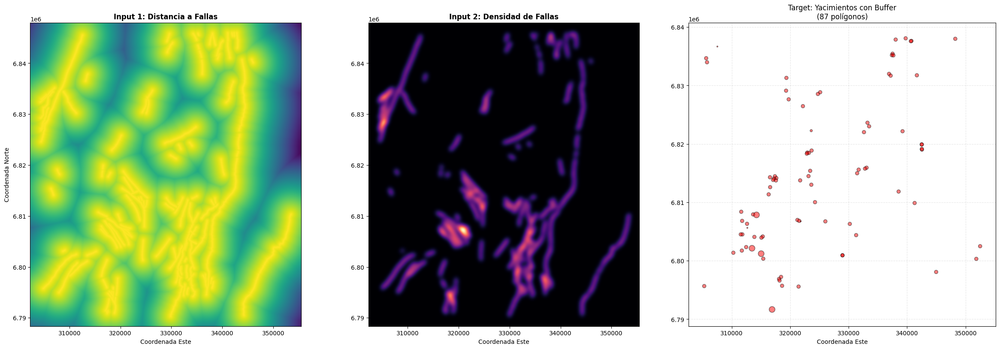

In [9]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show
import os

# --- RUTAS DE LOS ARCHIVOS ---
path_buffer = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_limpios/YACIMIENTOS_TARGET_BUFFER.shp"
path_distancia = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif"
path_densidad = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DENSIDAD_FALLAS_R1000m.tif"

print("GENERANDO VISUALIZACIÓN DE CAPAS INDIVIDUALES...\n")

try:
    # 1. Configurar el Lienzo (3 columnas)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))

    # --- PANEL 1: DISTANCIA A FALLAS (SOLO RASTER) ---
    if os.path.exists(path_distancia):
        src_dist = rasterio.open(path_distancia)
        show(src_dist, ax=ax1, cmap='viridis_r', title="Input 1: Distancia a Fallas")
        ax1.set_xlabel("Coordenada Este")
        ax1.set_ylabel("Coordenada Norte")
    else:
        ax1.text(0.5, 0.5, "Falta Raster Distancia", ha='center')

    # --- PANEL 2: DENSIDAD DE FALLAS (SOLO RASTER) ---
    if os.path.exists(path_densidad):
        src_dens = rasterio.open(path_densidad)
        show(src_dens, ax=ax2, cmap='magma', title="Input 2: Densidad de Fallas")
        ax2.set_xlabel("Coordenada Este")
    else:
        ax2.text(0.5, 0.5, "Falta Raster Densidad", ha='center')

    # --- PANEL 3: YACIMIENTOS (SOLO VECTOR) ---
    if os.path.exists(path_buffer):
        gdf_buffer = gpd.read_file(path_buffer)

        # Plotear solo los polígonos
        gdf_buffer.plot(ax=ax3, color='red', alpha=0.5, edgecolor='black')

        ax3.set_title(f"Target: Yacimientos con Buffer\n({len(gdf_buffer)} polígonos)", fontsize=12)
        ax3.set_xlabel("Coordenada Este")
        ax3.grid(True, linestyle='--', alpha=0.3)

        # Ajustar límites para que no se vea deforme si los puntos están muy dispersos
        ax3.set_aspect('equal')
    else:
        ax3.text(0.5, 0.5, "Falta Shapefile Yacimientos", ha='center')

    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"Error al visualizar: {e}")

In [10]:
import os
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from scipy.ndimage import distance_transform_edt

# --- RUTAS ---
# Usamos el mapa de fallas SOLO para copiar el tamaño de píxel y coordenadas (el "Molde")
PATH_MOLDE = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif"

# Tus shapes geológicos
PATH_DIQUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_INT_ASS_EST_L_32719.shp"
PATH_PLIEGUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_PLIEGUE_L_32719.shp"
OUTPUT_FOLDER = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/"

print("INICIANDO CÁLCULO DE DISTANCIAS...\n")

# 1. CARGAMOS EL "MOLDE" (Para que todos los mapas calcen píxel a píxel)
with rasterio.open(PATH_MOLDE) as src:
    meta = src.meta.copy()       # Copiamos la configuración (coordenadas, tamaño)
    shape_molde = src.shape      # El alto y ancho del mapa (ej. 2000x3000 px)
    transform_molde = src.transform # La fórmula para pasar de lat/lon a píxeles
    tamano_pixel = transform_molde[0] # Debería ser 30 (metros)

print(f"   Configuración cargada: Píxeles de {tamano_pixel} metros.")

# --- FUNCIÓN QUE HACE EL TRABAJO ---
def crear_mapa_distancia(ruta_shape, nombre_salida):
    print(f"\n   -------------------------------------------------")
    print(f"   Procesando: {os.path.basename(ruta_shape)}")

    # A. Leemos el vector (Shapefile)
    gdf = gpd.read_file(ruta_shape)

    if gdf.empty:
        print("   El archivo está vacío. No se generó nada.")
        return

    # B. "Quemamos" el vector en una grilla (Rasterizar)
    #    Esto crea una imagen donde: Dique = 1, Fondo = 0
    geometrias = ((geom, 1) for geom in gdf.geometry)

    mascara_binaria = rasterize(
        geometrias,
        out_shape=shape_molde,
        transform=transform_molde,
        fill=0,      # Fondo = 0
        default_value=1, # Dique = 1
        all_touched=True # Si toca un poquito del píxel, lo cuenta
    )

    # C. Calculamos la Distancia
    #    La función 'distance_transform_edt' calcula la distancia al CERO más cercano.
    #    Por eso invertimos la lógica: Queremos distancia AL DIQUE (que era 1).
    #    Entonces hacemos: (1 - mascara_binaria). Ahora Dique=0, Fondo=1.
    matriz_invertida = 1 - mascara_binaria

    #    Calculamos distancia en píxeles y multiplicamos por 30m
    distancia_en_metros = distance_transform_edt(matriz_invertida) * tamano_pixel

    # D. Guardamos el resultado
    ruta_salida = os.path.join(OUTPUT_FOLDER, nombre_salida)

    # Actualizamos metadatos para decir que guardamos decimales (float)
    meta.update(dtype='float32', count=1, nodata=-9999)

    with rasterio.open(ruta_salida, 'w', **meta) as dst:
        dst.write(distancia_en_metros.astype('float32'), 1)

    print(f"   Mapa guardado: {nombre_salida}")
    print(f"      -> Distancia mínima (sobre el dique): {distancia_en_metros.min()} m")
    print(f"      -> Distancia máxima (lejos del dique): {distancia_en_metros.max():.1f} m")

# --- EJECUTAMOS LA FUNCIÓN ---
try:
    # 2. Mapa de Diques
    crear_mapa_distancia(PATH_DIQUES, "DIST_DIQUES.tif")

    # 3. Mapa de Pliegues
    crear_mapa_distancia(PATH_PLIEGUES, "DIST_PLIEGUES.tif")

    print("\nPROCESO TERMINADO. Revisa la carpeta 'rasters_estructurales'.")

except Exception as e:
    print(f"Ocurrió un error: {e}")

INICIANDO CÁLCULO DE DISTANCIAS...

   Configuración cargada: Píxeles de 30.0 metros.

   -------------------------------------------------
   Procesando: GB_INT_ASS_EST_L_32719.shp
   Mapa guardado: DIST_DIQUES.tif
      -> Distancia mínima (sobre el dique): 0.0 m
      -> Distancia máxima (lejos del dique): 28101.0 m

   -------------------------------------------------
   Procesando: GB_PLIEGUE_L_32719.shp
   Mapa guardado: DIST_PLIEGUES.tif
      -> Distancia mínima (sobre el dique): 0.0 m
      -> Distancia máxima (lejos del dique): 19837.1 m

PROCESO TERMINADO. Revisa la carpeta 'rasters_estructurales'.


GENERANDO VISUALIZACIÓN DE CONTROL MAGMÁTICO Y TRAMPAS...



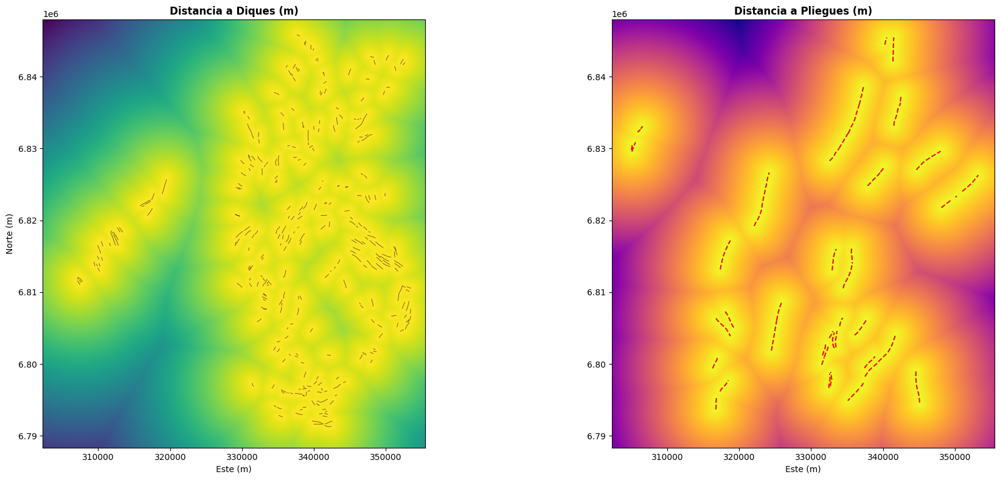

Interpretación:
   - Zonas Oscuras/Moradas: Estás encima de la estructura (Distancia = 0).
   - Zonas Amarillas: Estás muy lejos (baja probabilidad según criterio de cercanía).


In [11]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show
import os

# --- RUTAS DE LOS ARCHIVOS GENERADOS ---
PATH_R_DIQUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_DIQUES.tif"
PATH_R_PLIEGUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_PLIEGUES.tif"

# --- RUTAS DE LOS SHAPES ORIGINALES (Para dibujar encima) ---
PATH_S_DIQUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_INT_ASS_EST_L_32719.shp"
PATH_S_PLIEGUES = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_PLIEGUE_L_32719.shp"

print("GENERANDO VISUALIZACIÓN DE CONTROL MAGMÁTICO Y TRAMPAS...\n")

try:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    # --- MAPA 1: DIQUES (FUENTE DE CALOR) ---
    if os.path.exists(PATH_R_DIQUES):
        # 1. El Raster (Fondo)
        src_diques = rasterio.open(PATH_R_DIQUES)
        show(src_diques, ax=ax1, cmap='viridis_r', title="Distancia a Diques (m)")

        # 2. El Vector (Líneas)
        if os.path.exists(PATH_S_DIQUES):
            gdf_diques = gpd.read_file(PATH_S_DIQUES)
            gdf_diques.plot(ax=ax1, color='black', linewidth=0.8, alpha=0.5, label='Diques')

        ax1.set_xlabel("Este (m)")
        ax1.set_ylabel("Norte (m)")
    else:
        ax1.text(0.5, 0.5, " No se encontró DIST_DIQUES.tif", ha='center')

    # --- MAPA 2: PLIEGUES (TRAMPAS) ---
    if os.path.exists(PATH_R_PLIEGUES):
        # 1. El Raster (Fondo)
        src_pliegues = rasterio.open(PATH_R_PLIEGUES)
        show(src_pliegues, ax=ax2, cmap='plasma_r', title="Distancia a Pliegues (m)")

        # 2. El Vector (Líneas)
        if os.path.exists(PATH_S_PLIEGUES):
            gdf_pliegues = gpd.read_file(PATH_S_PLIEGUES)
            gdf_pliegues.plot(ax=ax2, color='red', linewidth=1.5, linestyle='--', label='Ejes Pliegue')

        ax2.set_xlabel("Este (m)")
    else:
        ax2.text(0.5, 0.5, " No se encontró DIST_PLIEGUES.tif", ha='center')

    plt.tight_layout()
    plt.show()

    print("Interpretación:")
    print("   - Zonas Oscuras/Moradas: Estás encima de la estructura (Distancia = 0).")
    print("   - Zonas Amarillas: Estás muy lejos (baja probabilidad según criterio de cercanía).")

except Exception as e:
    print(f"Error al visualizar: {e}")

PROCESANDO CONTACTOS INTRUSIVOS...

   Leyendo shapefile...
   Filtrado: De 2452 contactos totales -> 617 son INTRUSIVOS.
   Calculando distancia euclidiana...
   Mapa guardado: DIST_CONTACTOS_INTRUSIVOS.tif
      -> Distancia Máxima calculada: 12696.2 m

   Generando vista previa...


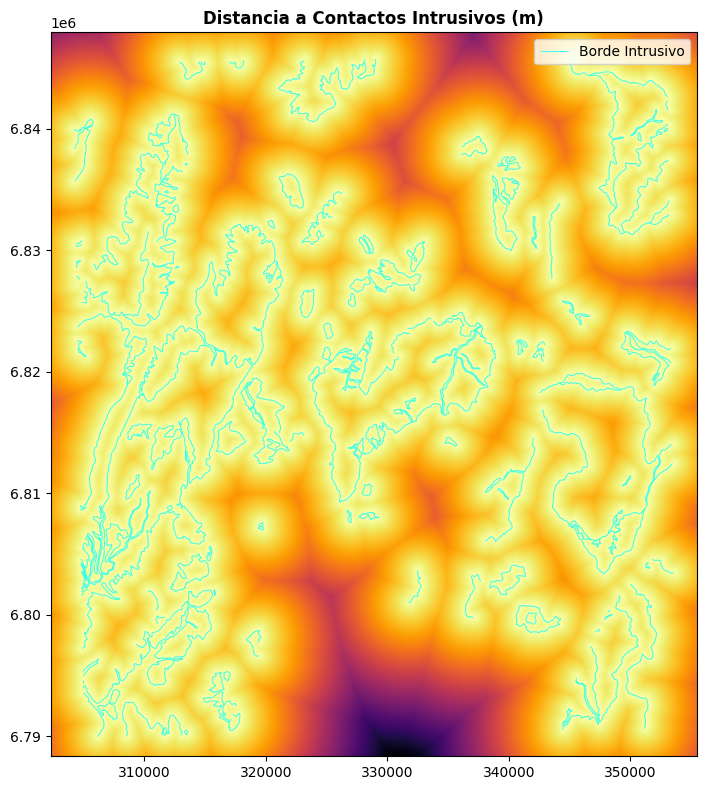

In [12]:
import os
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
from scipy.ndimage import distance_transform_edt
import numpy as np
import matplotlib.pyplot as plt
from rasterio.plot import show

# --- RUTAS ---
# Shapefile original de Contactos
PATH_CONTACTOS = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/CONTACTOS_32719.shp"
# Molde (para alinear píxeles)
PATH_MOLDE = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif"
# Salida
OUTPUT_FOLDER = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/"

print("PROCESANDO CONTACTOS INTRUSIVOS...\n")

try:
    # 1. CARGAR MOLDE
    if not os.path.exists(PATH_MOLDE):
        raise FileNotFoundError(" No se encontró el mapa molde (DIST_FALLAS.tif).")

    with rasterio.open(PATH_MOLDE) as src:
        meta = src.meta.copy()
        shape = src.shape
        transform = src.transform
        pixel_size = transform[0]

    # 2. CARGAR Y FILTRAR VECTOR
    print("   Leyendo shapefile...")
    gdf = gpd.read_file(PATH_CONTACTOS)

    # --- EL FILTRO MAGICO ---
    # Nos quedamos solo con lo que diga "Intrusivo" (ignoramos mayúsculas/minúsculas)
    gdf_intrusivos = gdf[gdf['SUBTIPO_DE'].astype(str).str.contains('Intrusivo', case=False, na=False)]

    print(f"   Filtrado: De {len(gdf)} contactos totales -> {len(gdf_intrusivos)} son INTRUSIVOS.")

    if gdf_intrusivos.empty:
        print("   No se encontraron contactos intrusivos. Revisa el nombre de la columna.")
    else:
        # 3. RASTERIZAR (QUEMAR LÍNEAS)
        print("   Calculando distancia euclidiana...")
        shapes = ((geom, 1) for geom in gdf_intrusivos.geometry)
        mask = rasterize(shapes, out_shape=shape, transform=transform, fill=0, all_touched=True)

        # 4. CALCULAR DISTANCIA (AL BORDE INTRUSIVO)
        # Invertimos la máscara: 0=Intrusivo, 1=Roca Caja
        distancia = distance_transform_edt(1 - mask) * pixel_size

        # 5. GUARDAR
        nombre_salida = "DIST_CONTACTOS_INTRUSIVOS.tif"
        out_path = os.path.join(OUTPUT_FOLDER, nombre_salida)

        meta.update(dtype='float32', count=1, nodata=-9999)
        with rasterio.open(out_path, 'w', **meta) as dst:
            dst.write(distancia.astype('float32'), 1)

        print(f"   Mapa guardado: {nombre_salida}")
        print(f"      -> Distancia Máxima calculada: {distancia.max():.1f} m")

        # --- VISUALIZACIÓN RÁPIDA ---
        print("\n   Generando vista previa...")
        fig, ax = plt.subplots(figsize=(10, 8))

        # Fondo: Mapa de Distancia
        show(rasterio.open(out_path), ax=ax, cmap='inferno_r', title="Distancia a Contactos Intrusivos (m)")

        # Encima: Líneas de Contacto (Cyan para que resalte)
        gdf_intrusivos.plot(ax=ax, color='cyan', linewidth=0.8, alpha=0.7, label='Borde Intrusivo')

        plt.legend()
        plt.tight_layout()
        plt.show()

except Exception as e:
    print(f"Error Crítico: {e}")

PROCESANDO LITOLOGÍA (JURÁSICO Y CRETÁCICO)...

REPORTE DE FILTRADO:
   -> Total Polígonos: 789
   -> Favorables (J-K): 402 
   -> No Favorables (Q, Pz, etc): 387 

   Ejemplos de Códigos ACEPTADOS (Primeros 10):
      ['Kc1' 'JKpc3a' 'JKpc1a' 'Kc1a' 'Kin2' 'Kc1c' 'Kin1a' 'Ksm(gd)' 'Kih(d)'
 'Kih(gd)']

   Ejemplos de Códigos DESCARTADOS (Primeros 10):
      ['PlHa2' 'PlHa1' 'MPligh' 'MPlia' 'PlHf' 'PlHrm' 'Mgd' 'PlHc' 'Mgd(a)'
 'Han']

   Mapa Binario Guardado: LITO_EDAD_FAVORABLE.tif

   Generando mapa...


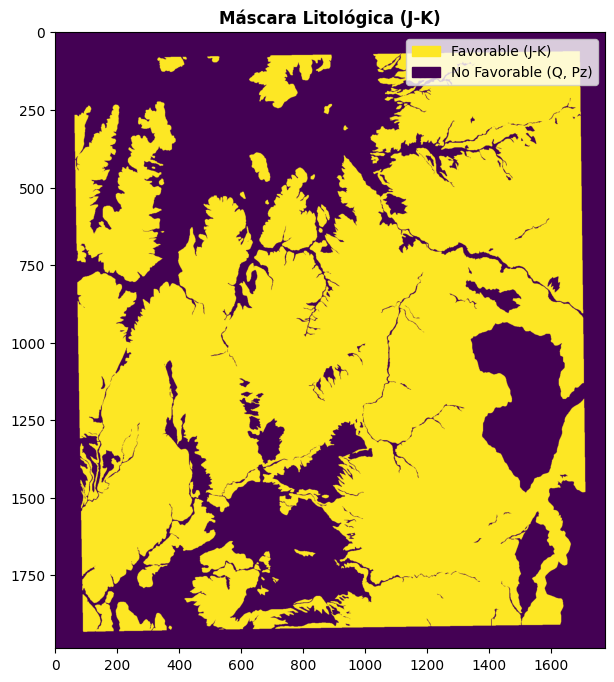

In [14]:
import os
import geopandas as gpd
import rasterio
from rasterio.features import rasterize
import matplotlib.pyplot as plt
from rasterio.plot import show
import matplotlib.patches as mpatches

# --- RUTAS ---
PATH_LITO = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/GB_LITO_P_32719.shp"
PATH_MOLDE = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif"
OUTPUT_FOLDER = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/"

print("PROCESANDO LITOLOGÍA (JURÁSICO Y CRETÁCICO)...\n")

try:
    # 1. CARGAR MOLDE (Alineación perfecta)
    if not os.path.exists(PATH_MOLDE):
        raise FileNotFoundError("Falta el mapa molde (DIST_FALLAS.tif).")

    with rasterio.open(PATH_MOLDE) as src:
        meta = src.meta.copy()
        shape = src.shape
        transform = src.transform

    # 2. CARGAR SHAPEFILE
    gdf = gpd.read_file(PATH_LITO)

    # 3. APLICAR FILTRO "J" o "K"
    # Convertimos a string y mayúsculas para no fallar
    # Regex: Contiene J o K
    # OJO: Excluimos 'Q' (Cuaternario) explícitamente si quisieras, pero al filtrar solo J/K ya quedan fuera.
    filtro_edad = gdf['CODIGO'].astype(str).str.contains('J|K', case=False, regex=True)

    gdf_favorable = gdf[filtro_edad].copy()
    gdf_no_favorable = gdf[~filtro_edad].copy()

    # --- REPORTE DE CALIDAD ---
    print(f"REPORTE DE FILTRADO:")
    print(f"   -> Total Polígonos: {len(gdf)}")
    print(f"   -> Favorables (J-K): {len(gdf_favorable)} ")
    print(f"   -> No Favorables (Q, Pz, etc): {len(gdf_no_favorable)} ")

    print("\n   Ejemplos de Códigos ACEPTADOS (Primeros 10):")
    print(f"      {gdf_favorable['CODIGO'].unique()[:10]}")

    print("\n   Ejemplos de Códigos DESCARTADOS (Primeros 10):")
    print(f"      {gdf_no_favorable['CODIGO'].unique()[:10]}")

    # 4. RASTERIZAR (BINARIO)
    # Quemamos un "1" donde hay J/K. El fondo queda en "0".
    shapes = ((geom, 1) for geom in gdf_favorable.geometry)

    mask_lito = rasterize(
        shapes,
        out_shape=shape,
        transform=transform,
        fill=0,       # Todo lo que no es J/K es 0
        default_value=1,
        all_touched=True
    )

    # 5. GUARDAR
    nombre_salida = "LITO_EDAD_FAVORABLE.tif"
    out_path = os.path.join(OUTPUT_FOLDER, nombre_salida)

    # Usamos Byte (uint8) porque solo es 0 o 1, ahorra espacio
    meta.update(dtype='uint8', count=1, nodata=255)

    with rasterio.open(out_path, 'w', **meta) as dst:
        dst.write(mask_lito.astype('uint8'), 1)

    print(f"\n   Mapa Binario Guardado: {nombre_salida}")

    # 6. VISUALIZAR
    print("\n   Generando mapa...")
    fig, ax = plt.subplots(figsize=(10, 8))

    # Ploteamos el raster: Amarillo=1 (Bueno), Morado=0 (Malo)
    show(mask_lito, ax=ax, cmap='viridis', title="Máscara Litológica (J-K)")

    # Leyenda manual
    values = [1, 0]
    colors = [plt.cm.viridis(1.0), plt.cm.viridis(0.0)]
    patches = [mpatches.Patch(color=colors[0], label="Favorable (J-K)"),
               mpatches.Patch(color=colors[1], label="No Favorable (Q, Pz)")]
    plt.legend(handles=patches)

    plt.show()

except Exception as e:
    print(f" Error: {e}")

La idea de cualquier decision operativa en cualquier ambito es tener un respaldo de desicion, este metodo de autoencoder basicamente busca la normalidad en los datos y a partir de eso encuentra lo "anomalo", que en una situacion comun podria ser algo como "aca pareciera ser diferente" y estos metodos podrian ser un justificativo estadistico en vez de una percepcion. Este es un intento de aplicarlo pero no esta bueno

Cargando Dataset Maestro: Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet...
   -> Filas: 6832678, Columnas: ['Este_UTM', 'Norte_UTM', 'ASTER_Alteration', 'Anomaly_Score', 'Magnetometria', 'S2_Hierro', 'S2_Argilica', 'S2_Propilitica']

 Muestreando capas geológicas en las coordenadas del Parquet...
   Columna agregada: Dist_Fallas
   Columna agregada: Dist_Diques
   Columna agregada: Dist_Pliegues
   Columna agregada: Dist_Contactos
   Columna agregada: Lito_Favorable

Normalizando datos para Autoencoder (Todo a rango 0-1)...
   -> Satélite/Mag (División por 255): ['Magnetometria', 'S2_Hierro', 'S2_Argilica', 'S2_Propilitica']
   -> Geología (MinMax Scaler): ['Dist_Fallas', 'Dist_Diques', 'Dist_Pliegues', 'Dist_Contactos']
   -> Dataset listo para entrenamiento: (6832678, 9)

Entrenando Autoencoder...
Epoch 1/15
1502/1502 ━━━━━━━━━━━━━━━━━━━━ 14s 7ms/step - loss: 0.0292 - val_loss: 5.6312e-05
Epoch 2/15
1502/1502 ━━━━━━━━━━━━━━━━━━━━ 16s 4ms/step - loss: 0.0040 - val_loss: 1.3956e-05

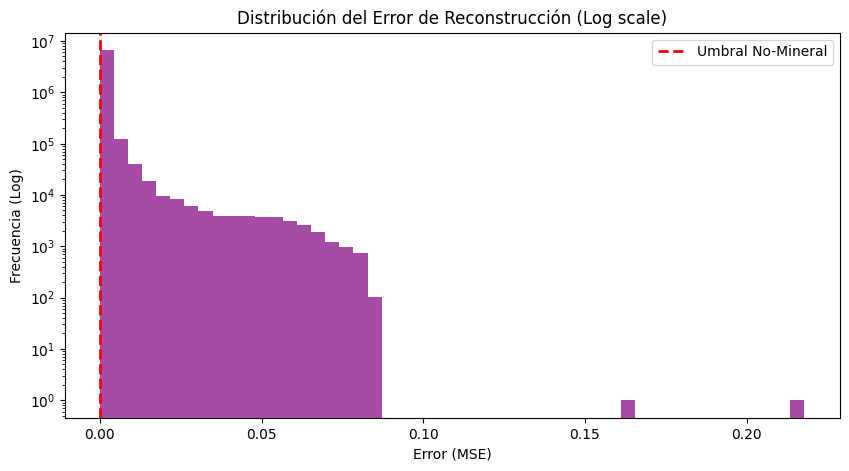

In [15]:
import pandas as pd
import geopandas as gpd
import rasterio
import numpy as np
import os
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
import joblib

# ==============================================================================
# 1. CARGAR DATASET MAESTRO (PARQUET)
# ==============================================================================
# Ajusta la ruta a tu archivo .parquet real (el que llamaste .basquet)
PATH_PARQUET = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet'
print(f"Cargando Dataset Maestro: {os.path.basename(PATH_PARQUET)}...")

df = pd.read_parquet(PATH_PARQUET)
print(f"   -> Filas: {len(df)}, Columnas: {df.columns.tolist()}")

# Asegurémonos de tener las coordenadas
if 'Este_UTM' not in df.columns or 'Norte_UTM' not in df.columns:
    # Si tus columnas se llaman diferente (ej. X, Y), ajusta aquí
    print(" ALERTA: Verificando nombres de columnas de coordenadas...")
    # df.rename(columns={'X': 'Este_UTM', 'Y': 'Norte_UTM'}, inplace=True)

# ==============================================================================
# 2. MUESTREO DE CAPAS GEOLÓGICAS (Inyectar Distancia al Parquet)
# ==============================================================================
# Rutas de tus nuevos rasters de distancia
RUTAS_GEOL = {
    "Dist_Fallas": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif",
    "Dist_Diques": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_DIQUES.tif",
    "Dist_Pliegues": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_PLIEGUES.tif",
    "Dist_Contactos": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_CONTACTOS_INTRUSIVOS.tif",
    "Lito_Favorable": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/LITO_EDAD_FAVORABLE.tif"
}

print("\n Muestreando capas geológicas en las coordenadas del Parquet...")

# Convertimos coordenadas a lista de pares (x, y) para rasterio
coords = [(x, y) for x, y in zip(df.Este_UTM, df.Norte_UTM)]

for nombre, ruta in RUTAS_GEOL.items():
    if os.path.exists(ruta):
        with rasterio.open(ruta) as src:
            # Sampleo: extrae el valor del píxel en cada coordenada
            # El generador devuelve arrays de 1 elemento, por eso tomamos val[0]
            valores = [val[0] for val in src.sample(coords)]

            # Asignar al DataFrame
            df[nombre] = valores

            # Manejo de NoData (-9999) -> Reemplazar por valor máximo (lo más lejos posible)
            # Ojo: Si es Lito (-9999 o 255), reemplazar por 0 (No favorable)
            if "Lito" in nombre:
                df[nombre] = df[nombre].replace([src.nodata, 255, -9999], 0)
            else:
                max_dist = np.nanmax(df[nombre].replace(src.nodata, np.nan))
                df[nombre] = df[nombre].replace(src.nodata, max_dist)

        print(f"   Columna agregada: {nombre}")
    else:
        print(f"   Archivo no encontrado: {ruta}")

# ==============================================================================
# 3. PREPARACIÓN Y NORMALIZACIÓN (El paso clave)
# ==============================================================================
print("\nNormalizando datos para Autoencoder (Todo a rango 0-1)...")

# A. Definir columnas por grupo
cols_sentinel_mag = [c for c in df.columns if 'S2_' in c or 'Mag' in c or 'Hierro' in c] # Ajusta según tus nombres reales en el parquet
cols_geologia_dist = ['Dist_Fallas', 'Dist_Diques', 'Dist_Pliegues', 'Dist_Contactos']
col_lito = ['Lito_Favorable']

print(f"   -> Satélite/Mag (División por 255): {cols_sentinel_mag}")
print(f"   -> Geología (MinMax Scaler): {cols_geologia_dist}")

# B. Crear matriz de entrenamiento (X_train)
X_train = pd.DataFrame()

# 1. Transformar Satélite/Mag (0-255 -> 0-1)
for col in cols_sentinel_mag:
    if col in df.columns:
        X_train[col] = df[col] / 255.0

# 2. Transformar Geología (Metros -> 0-1)
scaler_geo = MinMaxScaler()
if all(c in df.columns for c in cols_geologia_dist):
    X_train[cols_geologia_dist] = scaler_geo.fit_transform(df[cols_geologia_dist])

# 3. Litología (Ya es 0-1)
if 'Lito_Favorable' in df.columns:
    X_train['Lito_Favorable'] = df['Lito_Favorable']

# Limpieza final de NaNs (Autoencoder no tolera NaNs)
X_train = X_train.fillna(0)

print(f"   -> Dataset listo para entrenamiento: {X_train.shape}")

# ==============================================================================
# 4. ENTRENAMIENTO AUTOENCODER
# ==============================================================================
print("\nEntrenando Autoencoder...")

# Arquitectura
input_dim = X_train.shape[1]
encoding_dim = 5  # Cuello de botella

input_layer = Input(shape=(input_dim,))
# Encoder
encoded = Dense(12, activation='relu')(input_layer)
encoded = Dense(encoding_dim, activation='relu')(encoded)
# Decoder
decoded = Dense(12, activation='relu')(encoded)
decoded = Dense(input_dim, activation='sigmoid')(decoded) # Salida 0-1

autoencoder = Model(input_layer, decoded)
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Entrenar
history = autoencoder.fit(
    X_train, X_train,
    epochs=15,
    batch_size=4096, # Lote grande para velocidad
    shuffle=True,
    validation_split=0.1,
    verbose=1
)

# ==============================================================================
# 5. DETECCIÓN DE ANOMALÍAS Y GENERACIÓN DE 'NO YACIMIENTOS'
# ==============================================================================
print("\nCalculando Anomalías (Error de Reconstrucción)...")

predicciones = autoencoder.predict(X_train)
# Error Cuadrático Medio por fila (píxel)
mse = np.mean(np.power(X_train - predicciones, 2), axis=1)

# Agregamos el error al DataFrame original
df['Error_Reconstruccion'] = mse

# --- SELECCIÓN DE PUNTOS DE ENTRENAMIENTO NEGATIVO ---
# Estrategia: Los puntos con MENOR error son los más "normales" (Fondo / No mineral)
umbral_seguro = np.percentile(mse, 25) # El 25% con menos error
df['Candidato_No_Mineral'] = mse < umbral_seguro

print(f"   -> Umbral de corte (MSE): {umbral_seguro:.6f}")
print(f"   -> Puntos marcados como 'Seguro No Mineral': {df['Candidato_No_Mineral'].sum()}")

# Guardar resultado
ruta_salida_csv = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Final_Con_Anomalias.csv'
# Guardamos CSV ligero (coordenadas + error + flags) para visualización rápida o reentreno
cols_export = ['Este_UTM', 'Norte_UTM', 'Error_Reconstruccion', 'Candidato_No_Mineral']
if 'ID_YACIMIE' in df.columns: cols_export.append('ID_YACIMIE')

df[cols_export].to_csv(ruta_salida_csv, index=False)
print(f"Tabla de resultados guardada en: {ruta_salida_csv}")

# Visualización del Histograma de Error
plt.figure(figsize=(10, 5))
plt.hist(mse, bins=50, color='purple', alpha=0.7, log=True)
plt.axvline(umbral_seguro, color='red', linestyle='dashed', linewidth=2, label='Umbral No-Mineral')
plt.title("Distribución del Error de Reconstrucción (Log scale)")
plt.xlabel("Error (MSE)")
plt.ylabel("Frecuencia (Log)")
plt.legend()
plt.show()

Cargando resultados del Autoencoder...
   -> Error Máximo: 2.18e-01
   -> Error Promedio: 8.58e-04
 Reconstruyendo la imagen (Rasterizando puntos)...
   -> Dimensiones estimadas: 2992 x 2656 píxeles
   -> Resolución estimada: 28.541326347214635 metros
Generando Mapa de Anomalías...
   Yacimientos superpuestos.


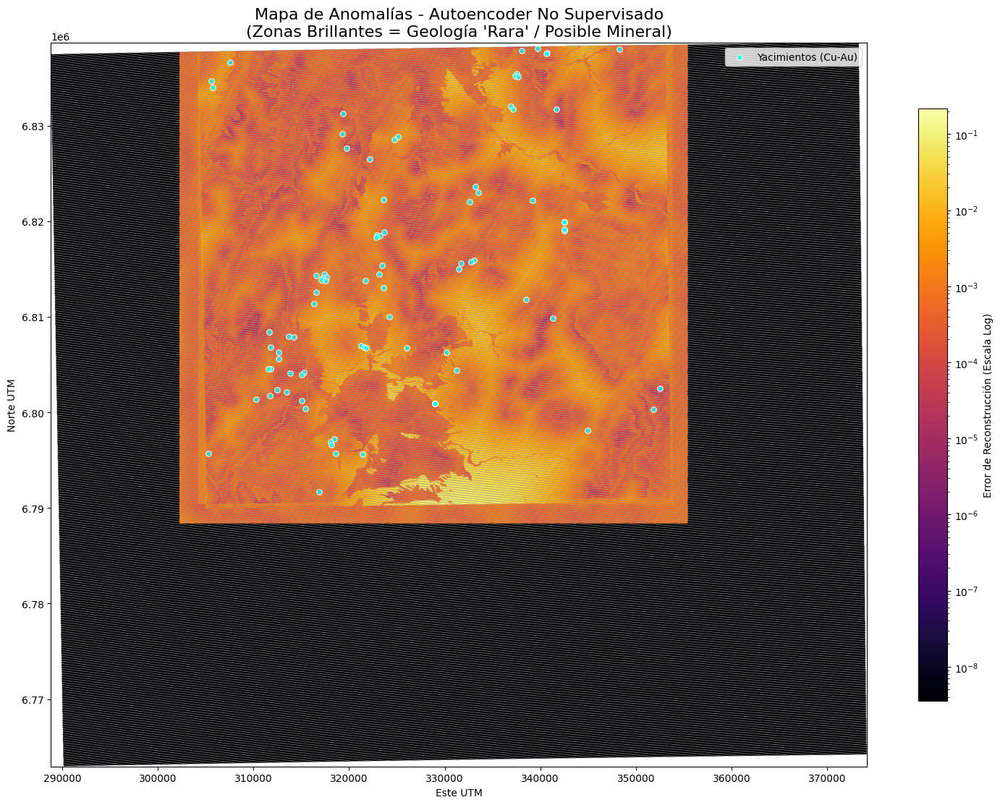

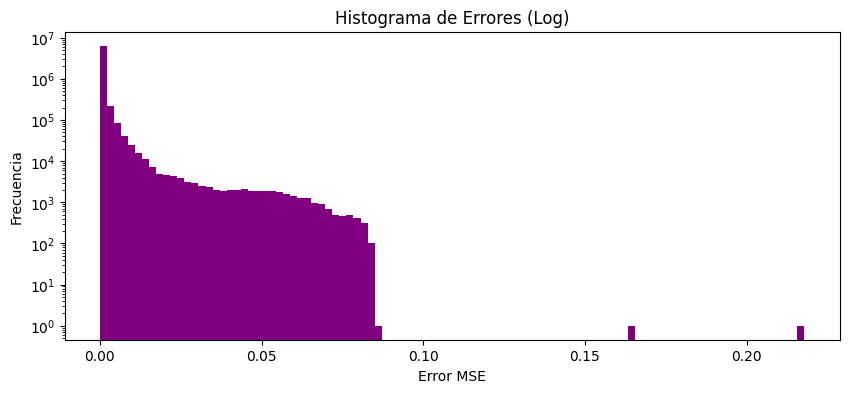

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy.interpolate import griddata
import matplotlib.colors as colors

# ==============================================================================
# 1. CARGAR DATOS
# ==============================================================================
PATH_CSV = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Final_Con_Anomalias.csv'
PATH_YACIMIENTOS = "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/shapes_reproyectados/YACIMIENTOS_32719.shp"

print("Cargando resultados del Autoencoder...")
df = pd.read_csv(PATH_CSV)

# Verificamos si el error es demasiado pequeño y necesita ajuste
max_error = df['Error_Reconstruccion'].max()
mean_error = df['Error_Reconstruccion'].mean()
print(f"   -> Error Máximo: {max_error:.2e}")
print(f"   -> Error Promedio: {mean_error:.2e}")

# ==============================================================================
# 2. RECONSTRUIR IMAGEN (GRILLA)
# ==============================================================================
print(" Reconstruyendo la imagen (Rasterizando puntos)...")

# Detectar resolución y dimensiones automáticamente
# Asumimos que los datos vienen de una grilla regular (Sentinel/Raster)
x_min, x_max = df['Este_UTM'].min(), df['Este_UTM'].max()
y_min, y_max = df['Norte_UTM'].min(), df['Norte_UTM'].max()

# Estimamos resolución (buscando la diferencia mínima entre coordenadas vecinas)
# Tomamos una muestra para no tardar mucho
sample = df.head(1000).sort_values('Este_UTM')
res_x = sample['Este_UTM'].diff().abs().min()
if res_x == 0 or np.isnan(res_x): res_x = 30.0 # Default a 30m si falla el cálculo

# Dimensiones de la imagen
width = int(np.ceil((x_max - x_min) / res_x)) + 1
height = int(np.ceil((y_max - y_min) / res_x)) + 1

print(f"   -> Dimensiones estimadas: {width} x {height} píxeles")
print(f"   -> Resolución estimada: {res_x} metros")

# Crear matriz vacía (llena de NaNs para el fondo)
grid_error = np.full((height, width), np.nan)

# Calcular índices de matriz
# Invertimos Y porque las imágenes tienen el origen arriba, pero los mapas abajo
col_indices = ((df['Este_UTM'].values - x_min) / res_x).astype(int)
row_indices = ((y_max - df['Norte_UTM'].values) / res_x).astype(int)

# Rellenar la matriz con el Error de Reconstrucción
# Usamos clipping para evitar índices fuera de rango por errores de redondeo
row_indices = np.clip(row_indices, 0, height - 1)
col_indices = np.clip(col_indices, 0, width - 1)

grid_error[row_indices, col_indices] = df['Error_Reconstruccion'].values

# ==============================================================================
# 3. VISUALIZACIÓN
# ==============================================================================
print("Generando Mapa de Anomalías...")

fig, ax = plt.subplots(figsize=(15, 12))

# A. MAPA DE FONDO (El Error del Autoencoder)
# Usamos escala logarítmica (LogNorm) porque los errores suelen tener picos muy altos
# 'inferno' o 'magma' son buenos para anomalías (Negro=Fondo, Amarillo/Blanco=Anomalía)
im = ax.imshow(grid_error, cmap='inferno', extent=[x_min, x_max, y_min, y_max],
               norm=colors.LogNorm(vmin=df['Error_Reconstruccion'].min() + 1e-10,
                                   vmax=df['Error_Reconstruccion'].max()))

plt.colorbar(im, ax=ax, label='Error de Reconstrucción (Escala Log)', shrink=0.7)

# B. SUPERPONER YACIMIENTOS (Validación)
try:
    if os.path.exists(PATH_YACIMIENTOS):
        gdf_yac = gpd.read_file(PATH_YACIMIENTOS)
        # Filtramos solo los metálicos como hicimos antes (opcional)
        filtro = gdf_yac['d_ASS_MENA'].astype(str).str.contains('Cu|Au|Mo|Ag', case=False, regex=True)
        gdf_yac = gdf_yac[filtro]

        gdf_yac.plot(ax=ax, color='cyan', marker='o', markersize=30,
                     edgecolor='white', alpha=0.7, label='Yacimientos (Cu-Au)')
        print("   Yacimientos superpuestos.")
    else:
        print("   No se encontró el shape de yacimientos para superponer.")
except Exception as e:
    print(f"   Error al cargar yacimientos: {e}")

# Decoración
ax.set_title("Mapa de Anomalías - Autoencoder No Supervisado\n(Zonas Brillantes = Geología 'Rara' / Posible Mineral)", fontsize=16)
ax.set_xlabel("Este UTM")
ax.set_ylabel("Norte UTM")
ax.legend(loc='upper right')
ax.grid(False)

plt.tight_layout()
plt.show()

# --- HISTOGRAMA DE CONTROL ---
# Para ver si necesitamos ajustar el umbral manualmente
plt.figure(figsize=(10, 4))
plt.hist(df['Error_Reconstruccion'], bins=100, log=True, color='purple')
plt.title("Histograma de Errores (Log)")
plt.xlabel("Error MSE")
plt.ylabel("Frecuencia")
plt.show()

 INICIANDO AUDITORÍA DE BORDES...

DATASET (PUNTOS):
   X: 288809.3 a 374159.8
   Y: 6762947.6 a 6838700.7
----------------------------------------
 CAPAS RASTER:
    LITOLOGIA (Referencia):
      Límites: 302285.1, 6788363.2, 355475.1, 6847943.2
      Resolución: 30.0 m
       ALERTA: Este raster es MÁS PEQUEÑO que tus puntos (Generará bordes falsos)
    DIST_FALLAS:
      Límites: 302285.1, 6788363.2, 355475.1, 6847943.2
      Resolución: 30.0 m
       ALERTA: Este raster es MÁS PEQUEÑO que tus puntos (Generará bordes falsos)
    MAGNETOMETRIA:
      Límites: 304248.3, 6790365.5, 353888.4, 6846491.0
      Resolución: 8.466666666667 m
       ALERTA: Este raster es MÁS PEQUEÑO que tus puntos (Generará bordes falsos)


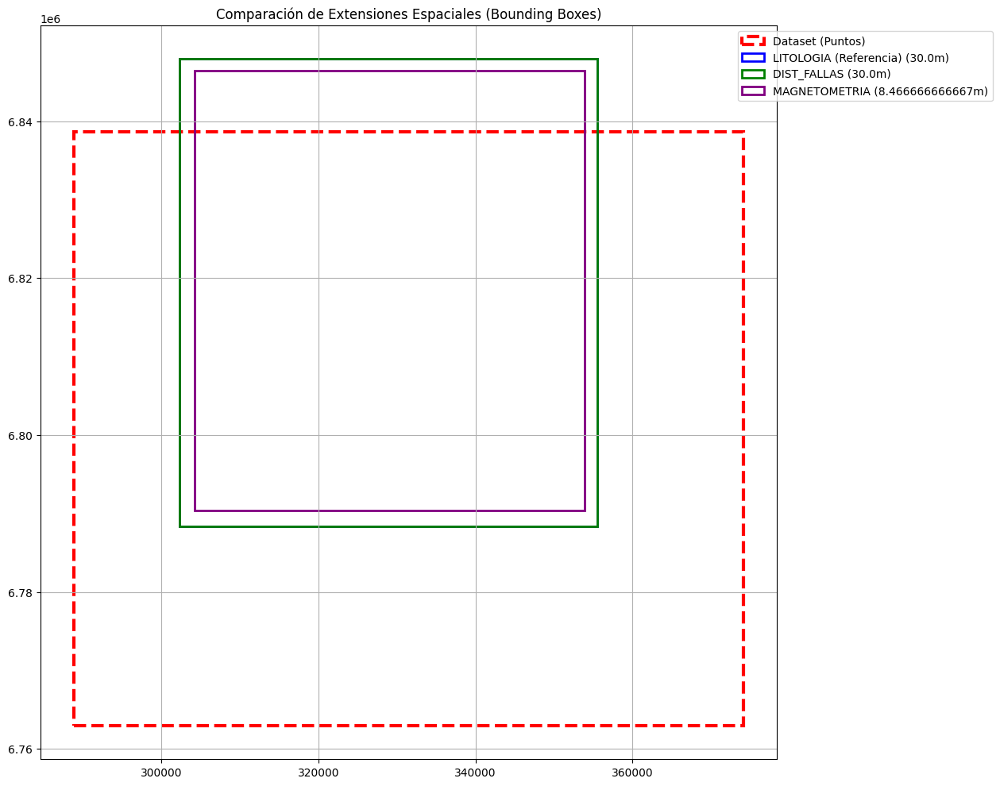

In [17]:
import rasterio
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

# ==============================================================================
# RUTAS A VERIFICAR
# ==============================================================================
# 1. Tu Dataset Maestro (El que usó el modelo)
PATH_PARQUET = '/content/drive/MyDrive/Proyectoprospectivo/Data/TABLAS/Dataset_Maestro_Con_Mag_Final_v2_Sentinel.parquet'

# 2. Tus Capas (Las mismas que usamos para entrenar)
capas_a_revisar = {
    "LITOLOGIA (Referencia)": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/LITO_EDAD_FAVORABLE.tif",
    "DIST_FALLAS": "/content/drive/MyDrive/Proyectoprospectivo/Data/GEOL/rasters_estructurales/DIST_FALLAS.tif",
    "MAGNETOMETRIA": "/content/drive/MyDrive/Proyectoprospectivo/Data/Mag/MagFusion/Magnetometria_Reconstruida.tif",
    # Agrega aquí una banda de Sentinel si tienes el TIF original, ej:
    # "SENTINEL": "/ruta/a/una/banda_sentinel.tif"
}

print(" INICIANDO AUDITORÍA DE BORDES...\n")

# A. OBTENER LÍMITES DEL PARQUET (Tus Puntos)
try:
    df = pd.read_parquet(PATH_PARQUET, columns=['Este_UTM', 'Norte_UTM'])
    min_x_p, max_x_p = df.Este_UTM.min(), df.Este_UTM.max()
    min_y_p, max_y_p = df.Norte_UTM.min(), df.Norte_UTM.max()

    print(f"DATASET (PUNTOS):")
    print(f"   X: {min_x_p:.1f} a {max_x_p:.1f}")
    print(f"   Y: {min_y_p:.1f} a {max_y_p:.1f}")
    print("-" * 40)
except Exception as e:
    print(f" Error leyendo Parquet: {e}")
    min_x_p, max_x_p, min_y_p, max_y_p = 0, 0, 0, 0

# B. GRAFICAR COMPARACIÓN
fig, ax = plt.subplots(figsize=(12, 12))

# Dibujar Dataset (Puntos) como un rectángulo ROJO (Línea punteada)
rect_p = patches.Rectangle((min_x_p, min_y_p), max_x_p - min_x_p, max_y_p - min_y_p,
                           linewidth=3, edgecolor='red', facecolor='none', linestyle='--', label='Dataset (Puntos)')
ax.add_patch(rect_p)

colores = ['blue', 'green', 'purple', 'orange', 'cyan']
i = 0

print(" CAPAS RASTER:")
for nombre, ruta in capas_a_revisar.items():
    if os.path.exists(ruta):
        with rasterio.open(ruta) as src:
            bounds = src.bounds
            res = src.res[0]

            print(f"    {nombre}:")
            print(f"      Límites: {bounds.left:.1f}, {bounds.bottom:.1f}, {bounds.right:.1f}, {bounds.top:.1f}")
            print(f"      Resolución: {res} m")

            # Dibujar rectángulo
            rect = patches.Rectangle((bounds.left, bounds.bottom), bounds.right - bounds.left, bounds.top - bounds.bottom,
                                     linewidth=2, edgecolor=colores[i % len(colores)], facecolor='none', label=f'{nombre} ({res}m)')
            ax.add_patch(rect)

            # Check rápido de coincidencia
            if (bounds.left > min_x_p + res) or (bounds.right < max_x_p - res):
                 print("       ALERTA: Este raster es MÁS PEQUEÑO que tus puntos (Generará bordes falsos)")

            i += 1
    else:
        print(f"    Archivo no encontrado: {nombre}")

ax.autoscale()
ax.set_aspect('equal')
plt.title("Comparación de Extensiones Espaciales (Bounding Boxes)")
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1))
plt.grid(True)
plt.show()